<a href="https://colab.research.google.com/github/AlejandroRMH/Proyecto-de-Se-ales-y-Sistemas-2-Etapa-2/blob/main/IE0247_Proyecto1_Etapa2_II_2023_Alejandro_Monge_C24948.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto de Señales y Sistemas 1: Medición de frecuencias cardiacas de electrocardiogramas (ECG)

### Estudiante: Alejandro Monge Hidalgo

### Carné: C24948

### Escuela de ingeniería eléctrica, UCR

# Importación de librerías

En esta parte inicial del código, se llaman las librerías que contienen funciones para leer los datos de los audios y generar gráficos a partir de estos:

"numpy" agrega funciones matemáticas que pueden ser utilizadas para cálculos; la librería “matplotlib.pyplot” se encarga de proveer funciones que permiten graficar datos.

In [ ]:
# Importar librerías de python
import numpy as np
import random as rd
import wave
import sys
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy.signal import butter, lfilter, filtfilt #Para filtrar datos
from statistics import stdev
sys.path.insert(1, r'./../functions')

# comandos para crear figuras de alta resolución con etiquetas grandes
%config InlineBackend.figure_formats = {'png', 'retina'}
plt.rcParams['axes.labelsize'] = 16 # tamaño de fuente para las etiquetas de las figuras
plt.rcParams['axes.titlesize'] = 18 # tamaño de fuente para los títulos de las figuras
plt.rcParams['font.size'] = 14 # tamaño de fuente para los npumeros de las figuras
plt.rcParams['lines.linewidth'] = 1.4 # grueso de línea para los gráficos

# Etapa 1

### Extracción y graficación de los datos de los audios

En esta parte del código se crea una función que extrae la información de 15 los audios seleccionados y se generan las gráficas de estos. Para la etapa 2 se decidió cambiar la lista de audios, ya que, los audios de la etapa 1 contenían demasiado ruido haciendo más dificil la medición de las frecuencias cardiacas.

In [ ]:
# Función encargada de extrare el número de canales de grabación, rango de muestreo, tiempo y señal
# el argumento "variable" contendrá el nombre del archivo más la extensión ".wav"
def ecg(variable):
    record = wave.open(variable, 'r') # cargar datos

    # extrare el número de canales de grabación, rango de muestreo, tiempo y señal
    numChannels = record.getnchannels() #número de canales
    numFrames = record.getnframes() #número de frames
    sampleRate = record.getframerate() #rango de muestras
    sampleWidth = record.getsampwidth()

    # información de las ondas
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # tiempo de ventana de muestreo
    timeECG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeECG, waveData

In [ ]:
#Lista de archivos ".wav"
nice = ["d0002","d0004","d0005","d0010","d0011","d0012","d0013","a0001","a0003","a0005","a0007","a0008","a0010","a0011","d0001"]

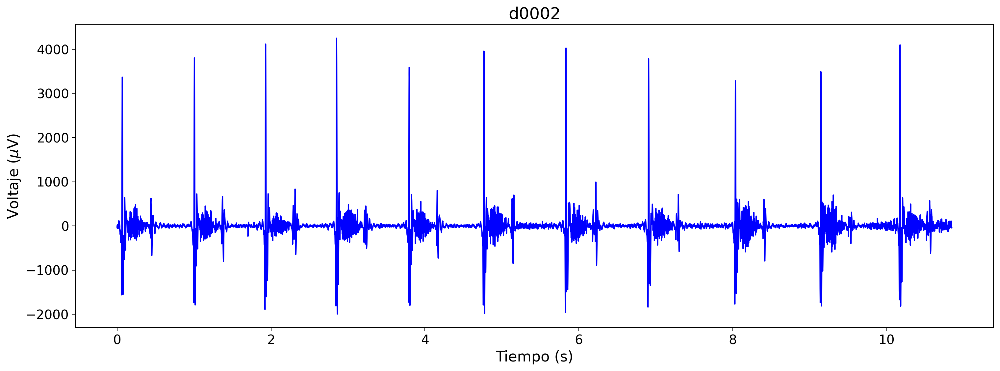

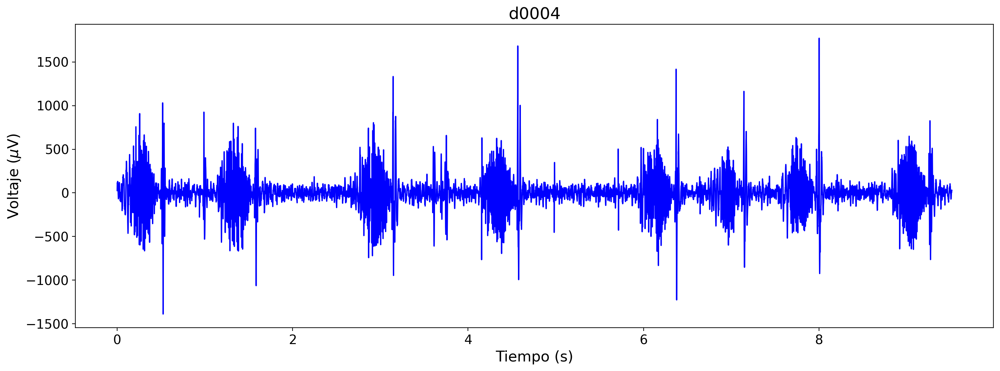

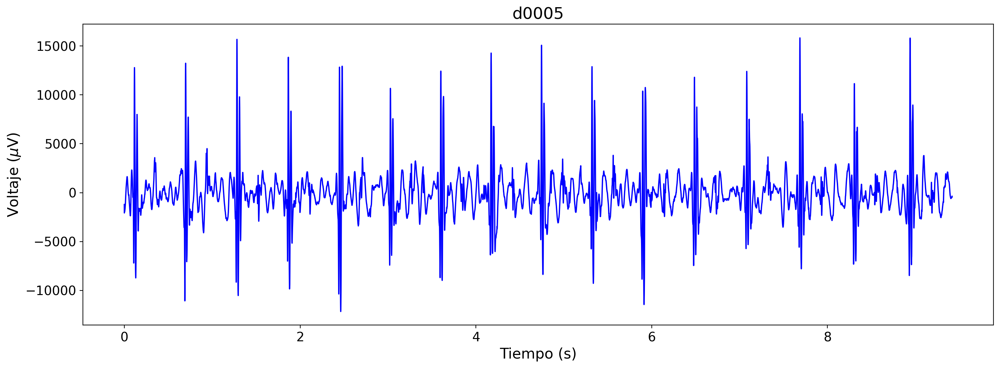

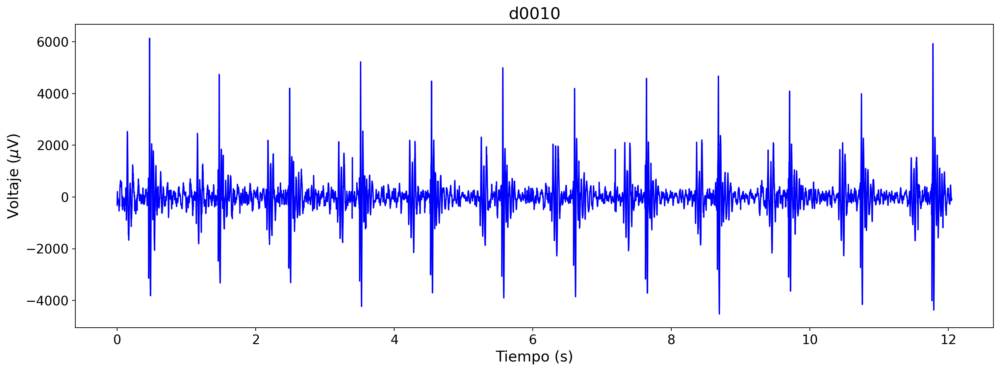

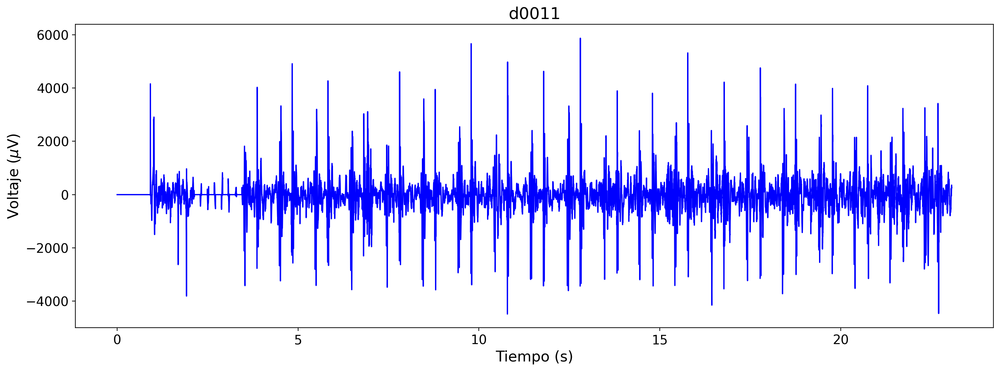

...

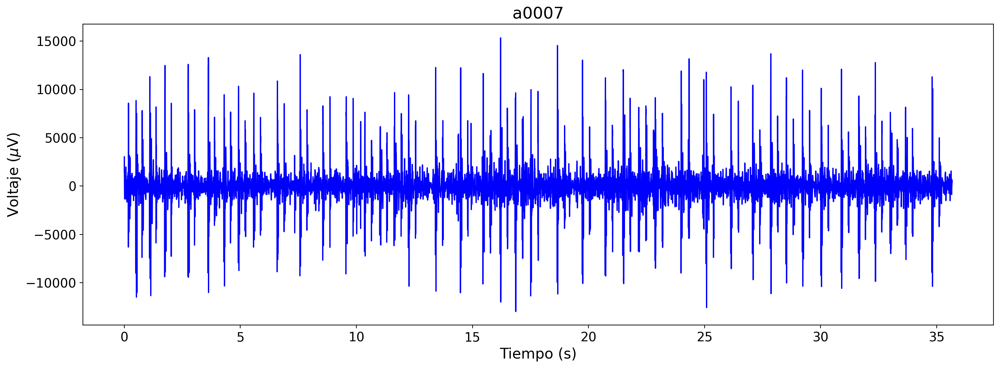

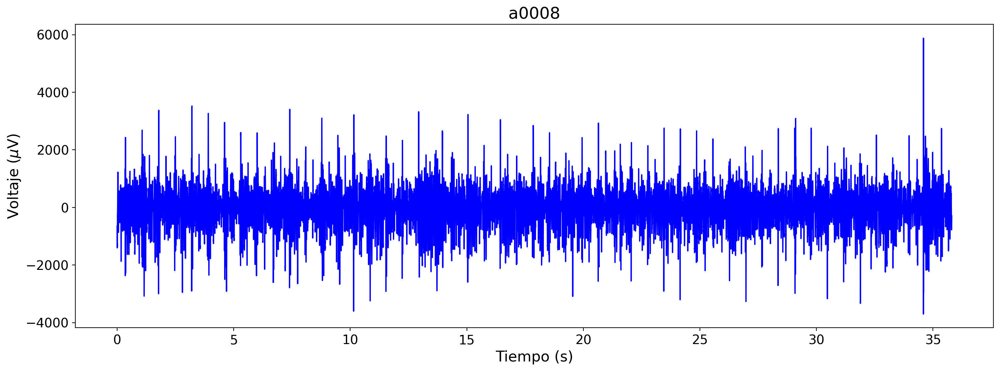

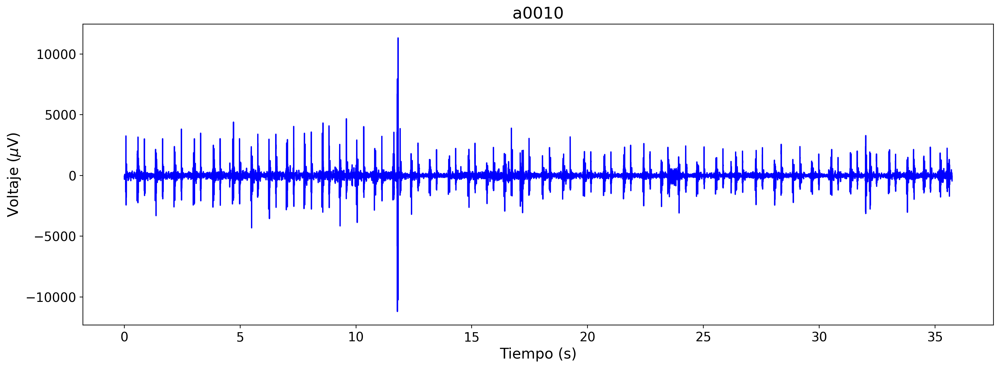

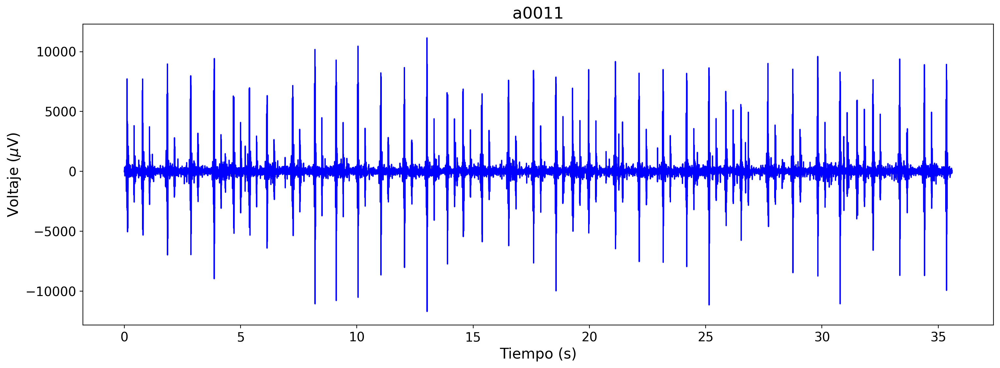

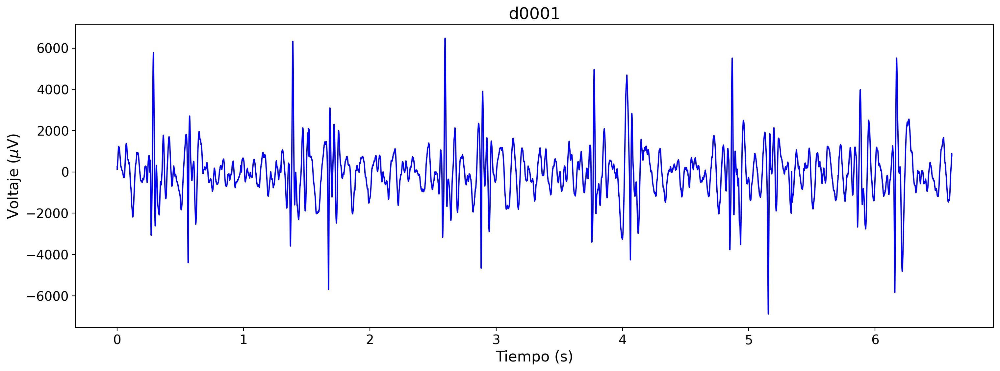

In [ ]:
#Representación gráfica 15 señales
for i in range(0, len(nice)):
    timeECG, waveData = ecg(nice[i]+'.wav')

    plt.figure(figsize=(18,6))
    plt.xlabel(r'Tiempo (s)')
    plt.ylabel(r'Voltaje ($\mu$V)')
    plt.plot(timeECG,waveData, 'b')
    plt.title(nice[i])
    plt.show()

Se procede a graficar 3 pulsos de la onda elegida en la etapa 1.

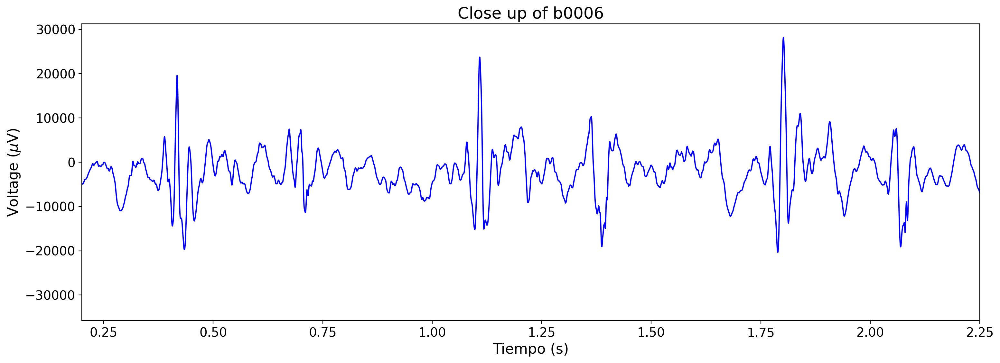

In [ ]:
#Datos de señal
timeECG, waveData = ecg("b0006.wav")

#Graficar 3 pulsos
plt.figure(figsize=(18,6))
plt.xlabel(r'Tiempo (s)')
plt.ylabel(r'Voltage ($\mu$V)')
plt.plot(timeECG,waveData, 'b')
plt.xlim(0.2,2.25)
plt.title("Close up of b0006")
plt.show()

Se procede a graficar un pulso de la onda elegida en la etapa 1.

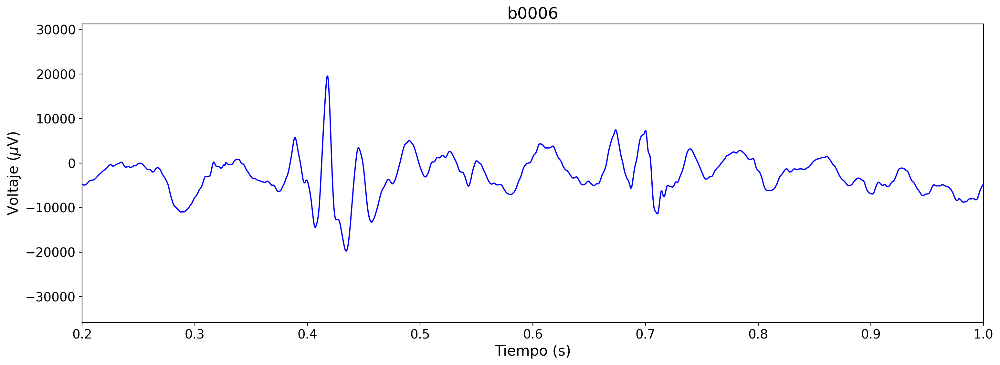

In [ ]:
#Graficar un pulso
plt.figure(figsize=(18,6))
plt.xlabel(r'Tiempo (s)')
plt.ylabel(r'Voltaje ($\mu$V)')
plt.plot(timeECG,waveData, 'b')
plt.xlim(0.2,1)
plt.title("b0006")
plt.show()

### Comienzo de la Etapa 2

En esta segunda etapa, se calculará la frecuencia cardiaca de los audios escogidos a base de los picos R que se pueden observar dentro de sus ECG.

El pico R es el valor, dentro de un latido de corazón, en donde se obtiene la amplitud local más alta.

Para que esta parte del código funcione correctamente, se buscaron audios que tuvieran el menor ruido posible o que al menos los picos R fueran mucho más altos en comparación del ruido. También, se busco que la mayor parte de los picos R dentro de cada audio mantuvieran una amplitud similar. Es por esta razón que se decidió cambiar los audios utilizados durante la primera etapa del proyecto por audios que cumplieran mejor con las características requeridas.

Primero se necesita definir un intervalo de medición para cada audio, el cual, será analizado y utilizado para encontrar los valores de frecuencia cardiaca. Para ello, se crean 2 listas, de las cuales, una contendrá los instantes en donde comienzan los intervalos ("n1") y la otra los instantes en donde se acaban ("n2") teniendo como unidad de medida los segundos. Estas listas se necesitarán en los comandos "for" que se utilizarán para graficar los datos de los audios seleccionados.

In [ ]:
# segundos en donde se va a cortar la medición
n1 = [0,2.5,2.5,0,7,4,2.5,1,0.5,3.5,1,0,5.25,7.5,0]
n2 = [10,8.5,5.5,10,11,8.5,7.5,10,10,6.25,3.5,6.5,7.5,10.3,5.5]

Ahora se procede a cargar los datos de los electrocardiográmas que sí funcionan para el análisis de frecuencia.

Para esto, se realiza un comando "for", el cual, en cada ciclo cargará los datos de uno de los audios en las variables "timeECG" y "waveData".

Los audios están conformados por una gran cantidad de mediciones instantáneas que se realizan durante un tiempo determinado. En el caso de los audios seleccionados, estos contienen 2000 mediciones por segundo. Por esta razón, cuando se desea recortar el audio en un intervalo en específico, es necesario multiplicar por 2000 los instantes de tiempo en donde se desea recortar, para de esta forma conocer los índices de las funciones "timeECG" y "waveData" en que se encuentran dichos instantes y guadar sólamente las mediciones realizadas en el rango delimitado por esos índices. Este cálculo se lleva a cabo y es guardado dentro de las variables "m1" y "m2", donde "m1" contiene el instante en donde comienza el intervalo y "m2" contiene el instante en donde termina el intervalo.

Con "m1" y "m2" calculados, se imprimen los valores para ser visualizados por el usuario y se recortan las variables "timeECG" y "waveData" para que sólo contengan los datos del intervalo entre "m1" y "m2". Finalmente, se grafica el intervalo mediante las funciones de la librería "matplotlib.pyplot": con la función "plt.figure(figsize=(18,6))", se delimita que el tamaño del gráfico tendrá las dimensiones 18x6; las funciones "plt.xlabel(r'time (s)')" y "plt.ylabel(r'voltage ($\mu$V)')" generan los títulos del eje "x" y el eje "y" respectivamente; la función "plt.plot(timeECG,waveData, 'b')" crea el gráfico colocando los valores de "waveData" en función de los valores de "timeECG"; mediante la función "plt.show()" se muestra el gráfico al usuario.

Instante inicial:  0.0
Instante final:  10.000460999446803


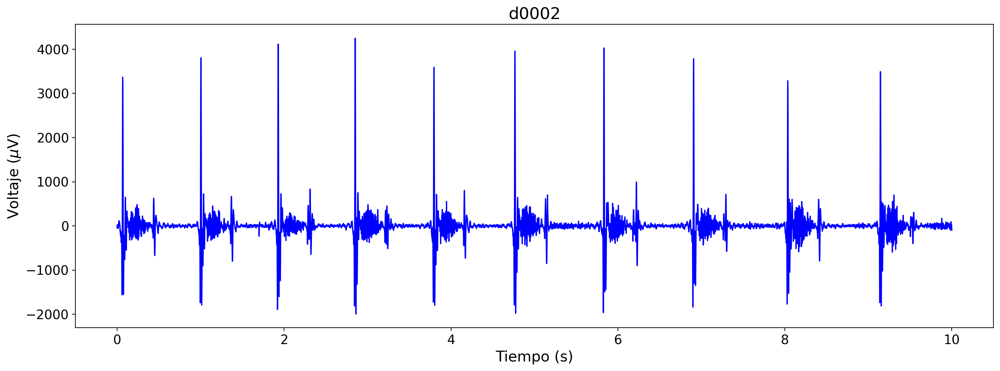

Instante inicial:  2.5001313922320914
Instante final:  8.50044673358911


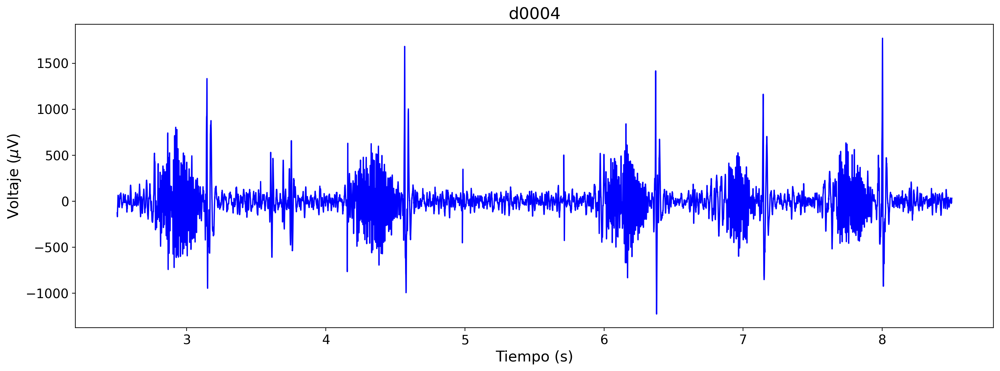

Instante inicial:  2.500132738664118
Instante final:  5.50029202506106


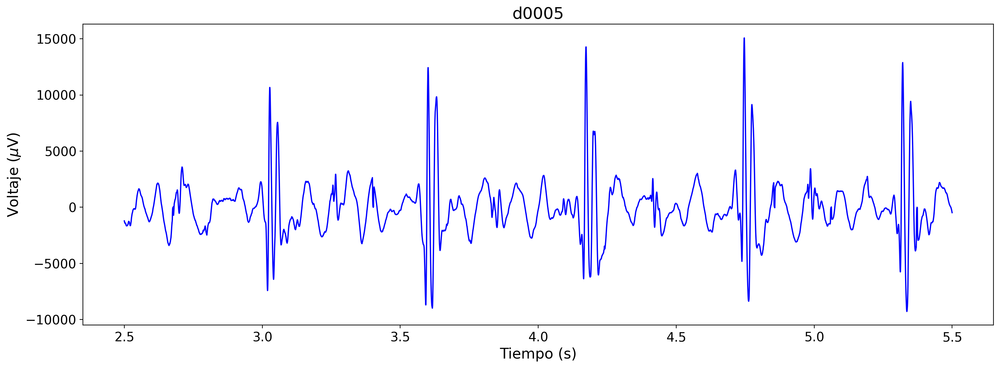

Instante inicial:  0.0
Instante final:  10.000415041089067


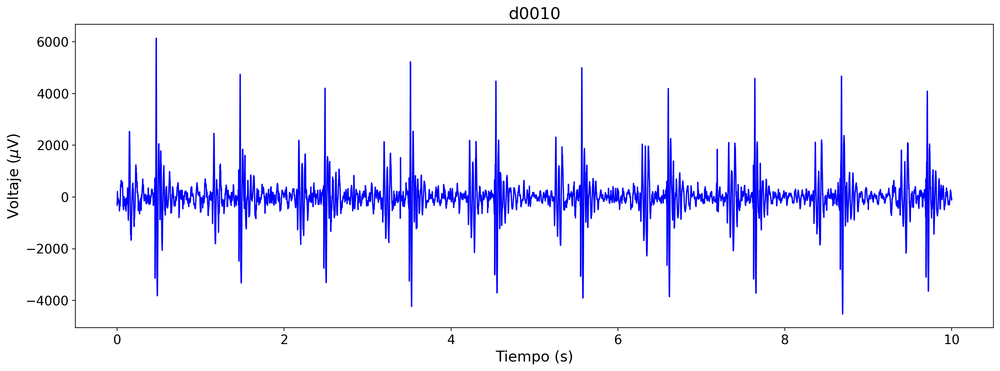

Instante inicial:  7.000151715468475
Instante final:  11.00023841002189


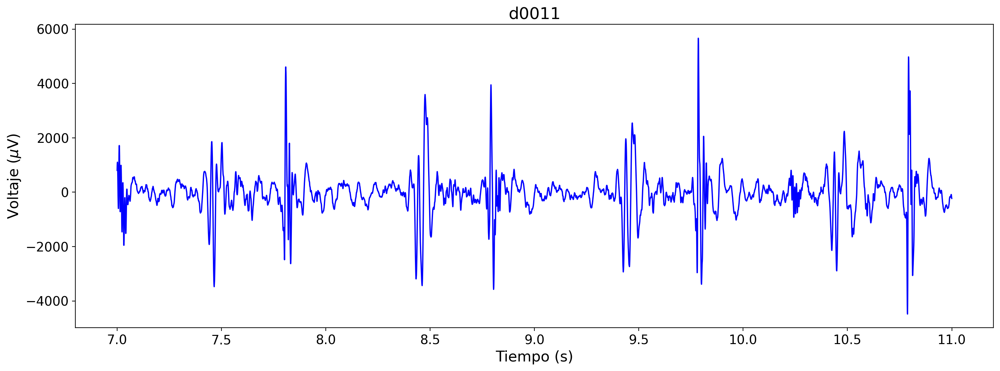

Instante inicial:  4.000117168048273
Instante final:  8.500248982102582


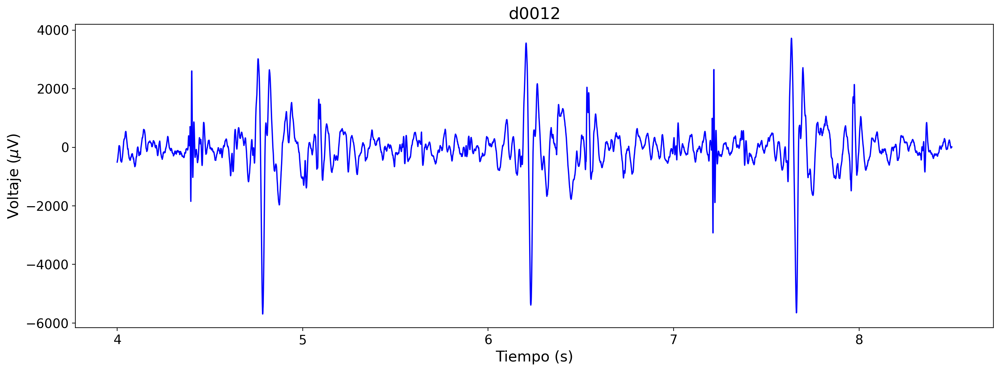

Instante inicial:  2.5001355674854944
Instante final:  7.500406702456483


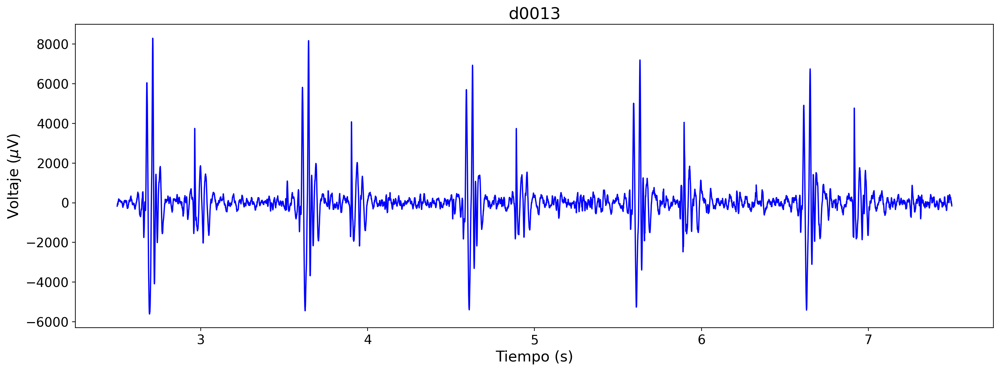

Instante inicial:  1.0000140191501592
Instante final:  10.000140191501592


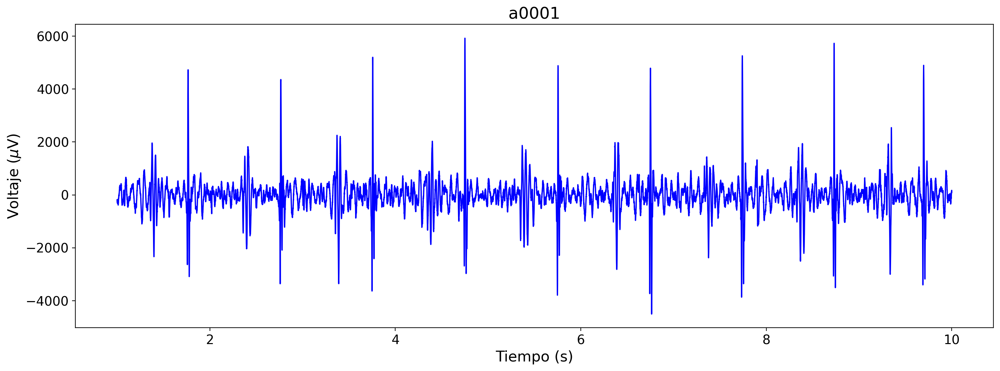

Instante inicial:  0.5000081381532903
Instante final:  10.000162763065806


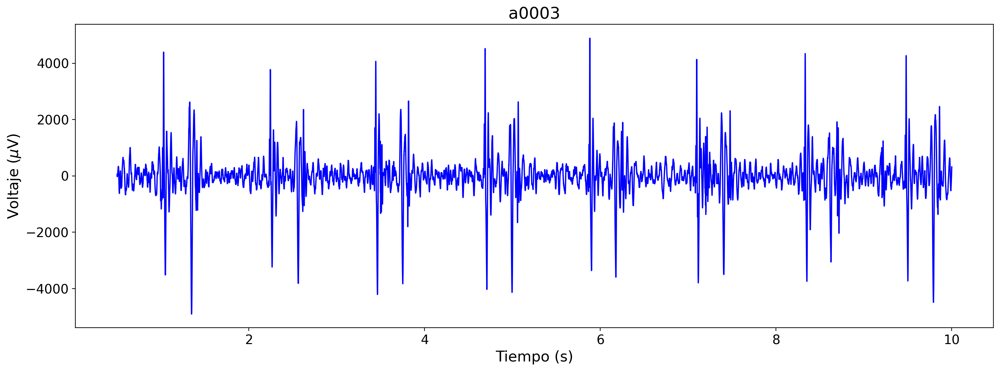

Instante inicial:  3.500049067025557
Instante final:  6.250087619688495


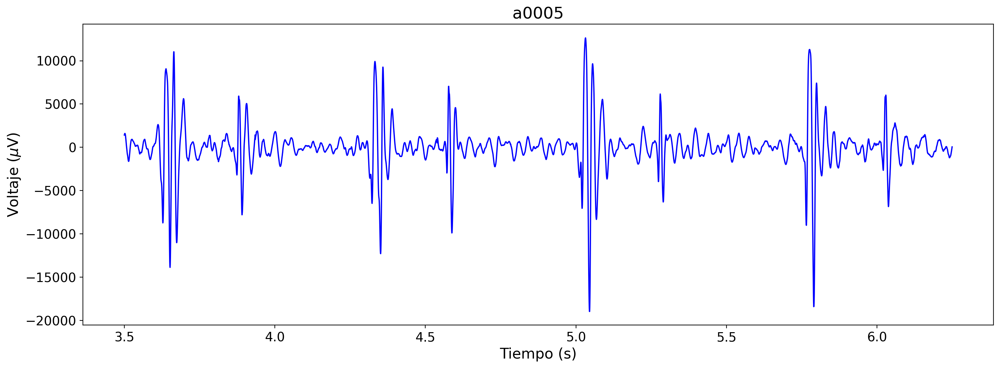

Instante inicial:  1.0000140191501592
Instante final:  3.500049067025557


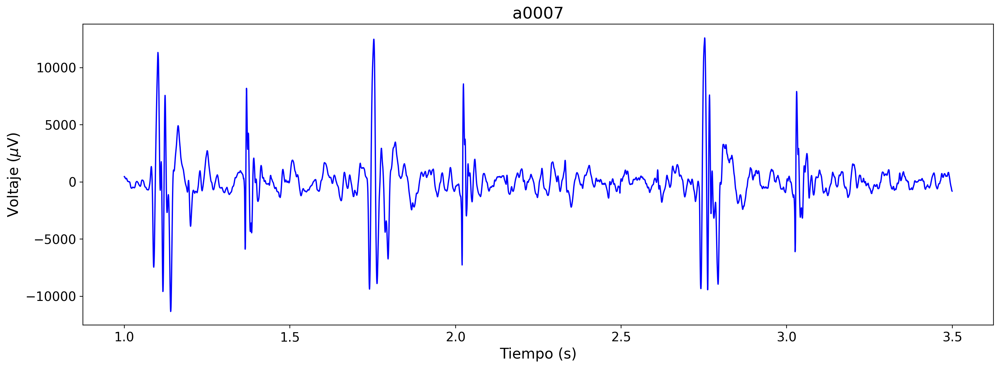

Instante inicial:  0.0
Instante final:  6.500090769445609


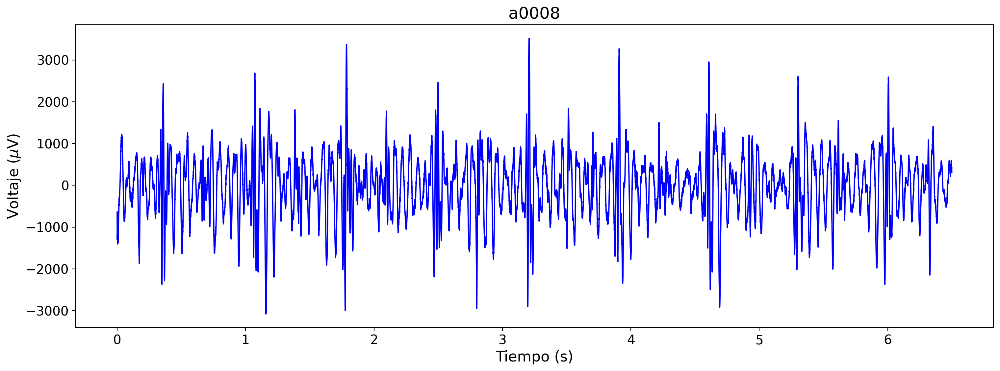

Instante inicial:  5.250073456366917
Instante final:  7.500104937667024


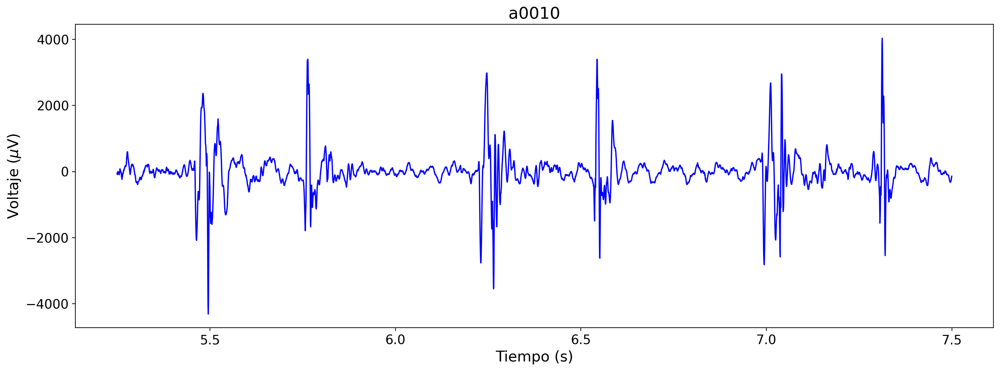

Instante inicial:  7.500105348915609
Instante final:  10.300144679177436


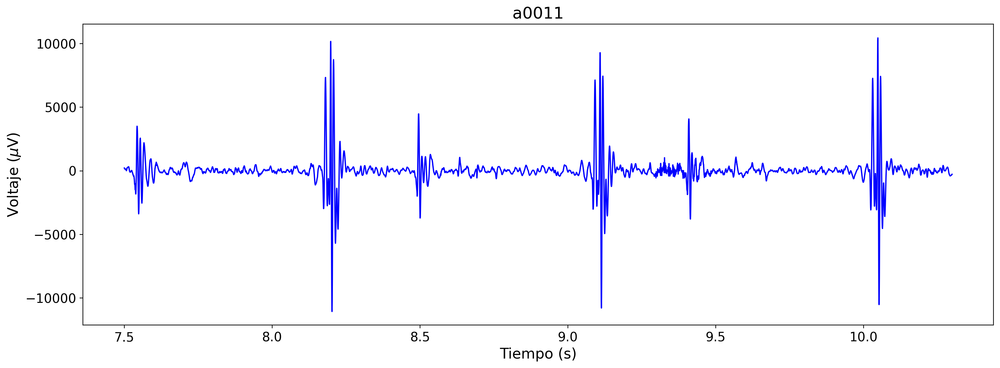

Instante inicial:  0.0
Instante final:  5.500416225215679


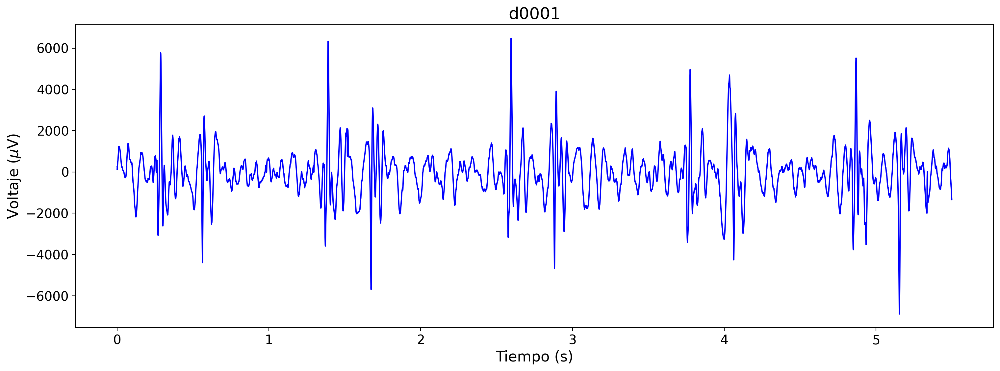

In [ ]:
for i in range(0, len(nice)):
    timeECG, waveData = ecg(nice[i]+'.wav')

    # se calcula las variables m1 y m2
    m1 = int(n1[i]*2000)
    m2 = int(n2[i]*2000)

    print("Instante inicial: ", timeECG[m1])
    print("Instante final: ", timeECG[m2])

    # se recorta el tamaño de las variables "timeECG" y "waveData" en donde se calcularán los picos R
    timeECG, waveData = timeECG[m1:m2], waveData[m1:m2]

    # se grafica el ECG
    plt.figure(figsize=(18,6))
    plt.xlabel(r'Tiempo (s)')
    plt.ylabel(r'Voltaje ($\mu$V)')
    plt.plot(timeECG,waveData, 'b')
    plt.title(nice[i])
    plt.show()

# Detección de picos R y cáculo de frecuencias cardiacas

La siguiente parte del código se encarga de detectar los picos R. El pico R es el punto en donde se alcanza la máxima amplitud en un latido de corazón.

Para ello, se crea la función "detecta_maximos_locales" que como bien dice su nombre, se encargará de detectar los pico R de los latidos y brindará los índices en donde estos se encuentran. Esta función necesitará recibir como argumento las variables "timeECG", "waveData" y un valor de umbral apartir de donde se realizará búsqueda de los picos R.

Lo primero que hará la función es revisar si "timeECG" y "waveData" tienen el mismo tamaño mediante un "if", y de no ser así, mostrará un texto de error explicando que las variables son de tamaños distintos. Luego, mediante un comando "for" irá revizando cada dato contenido en "waveData" y los clasificará mediante un if, guardando en la variable "mxs_indices" los índices en donde se encuentran los valores de los picos R. Finalmente, retornará los indices de los picos R a la variable en que se llame a la función.

In [ ]:
def detecta_maximos_locales(timeECG, waveData, threshold_ratio):
    # Si no todos los picos R son detectados, se baja el valor de threshold_ratio
    # Si puntos que no son picos R son detectados, se sube el valor de threshold_ratio

    if len(timeECG) != len(waveData): #Muestra un error si las variables timeECG y waveData tienen tamaños distintos
        raise Exception("Las dos variables son de tamaños distintos.")

    interval = max(waveData) - min(waveData) #calcula el intervalo el valor pico a pico máximo del intervalo de audio seleccionado
    threshold = threshold_ratio*interval + min(waveData)
    maxima = [] #variable que contiene el valor máximo
    maxima_indices = [] #variable que contiene los índices en donde se encuentran los valores que superan el valor de threshold
    mxs_indices = [] #variable que contiene los índices en donde se encuentran los valores de pico R y que serán regrezados de la función
    banner = False

    for i in range(0, len(waveData)):

        if waveData[i] >= threshold:#si se encuentra una amplitud que supera el valor de threshold, se guarda el índice de dicho valor en maxima_indices
            banner = True
            maxima_indices.append(i)
            maxima.append(waveData[i])

        elif banner == True and waveData[i] < threshold: #Si se cruza el valor de threshold, se guarda el índice del valor máximo en la matriz original
            index_local_max = maxima.index(max(maxima))
            mxs_indices.append(maxima_indices[index_local_max])
            maxima = []
            maxima_indices = []
            banner = False

    return mxs_indices

Se crea la lista "thr_ra" que contiene los valores de umbral apartir de donde se buscarán los valores pico R. Cada onda tiene un valor de umbral específico en dónde buscar sus pico R, es por esta razón que se crea la lista.

In [ ]:
#Lista con valores de "threshold_ratio" para cada ECG
thr_ra=[0.7,0.75,0.80,0.80,0.82,0.90,0.85,0.7,0.8,0.91,0.91,0.75,0.88,0.94,0.88]

Mediante un comando "for" se generan 3 gráficas distintas por cada audio:

La primera, es una gráfica en donde se muestra el intervalo seleccionado del audio con sus picos R resaltados con puntos rojos.

La segunda es una gráfica igual a la anterior pero con un acercamiento que muestra sólo 2 o 3 latidos para que el ususario los pueda vizualizar con más detalle.

La tercera gráfica muestra la frecuencia cardiaca en intervalos R-R.
Para generar esta última gráfica, se calcula la media de latidos por minuto de cada muestra, lo cual, se hace dividiendo la cantidad de picos R entre el periodo y multiplicándolo por 60. El resultado se guarda en la variable "mean_bpm". Luego, se calcula el ritmocardiaco por cada ciclo, además de la desviación estándar. Finalmente, en este última gráfica se puede apreciar el valor del ritmo cardiaco marcado con puntos azules, la media de ritmo cardiaco marcada con una línea roja y la desviación estándar marcada con una región roja.

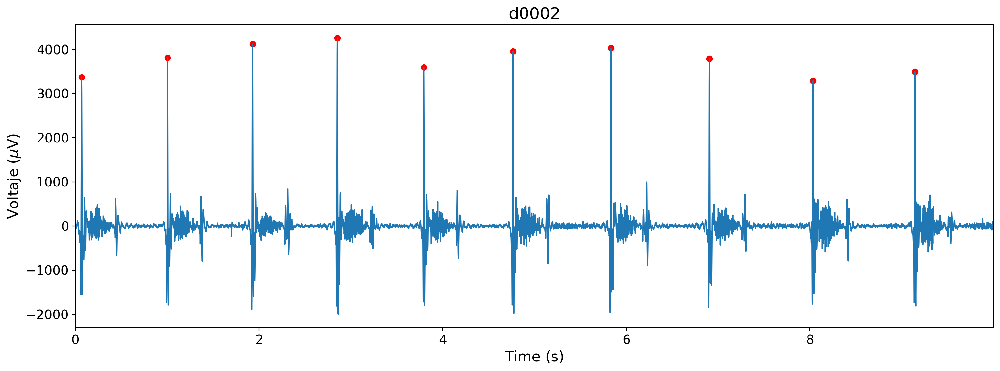

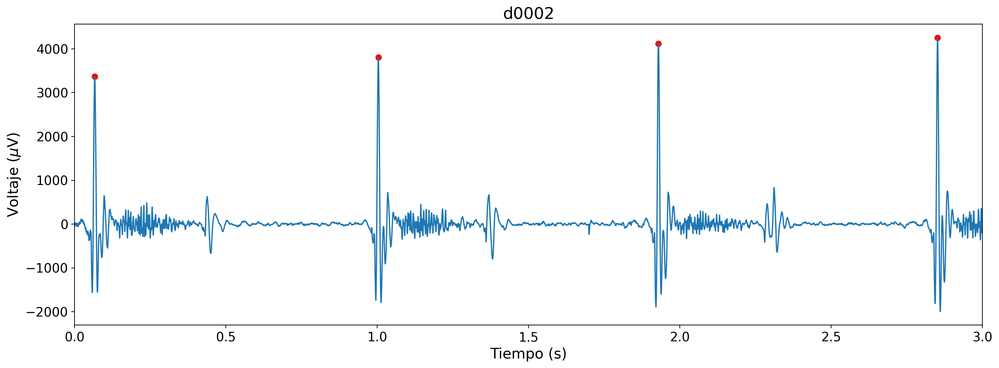

Latidos por minuto: 60.00023414253273


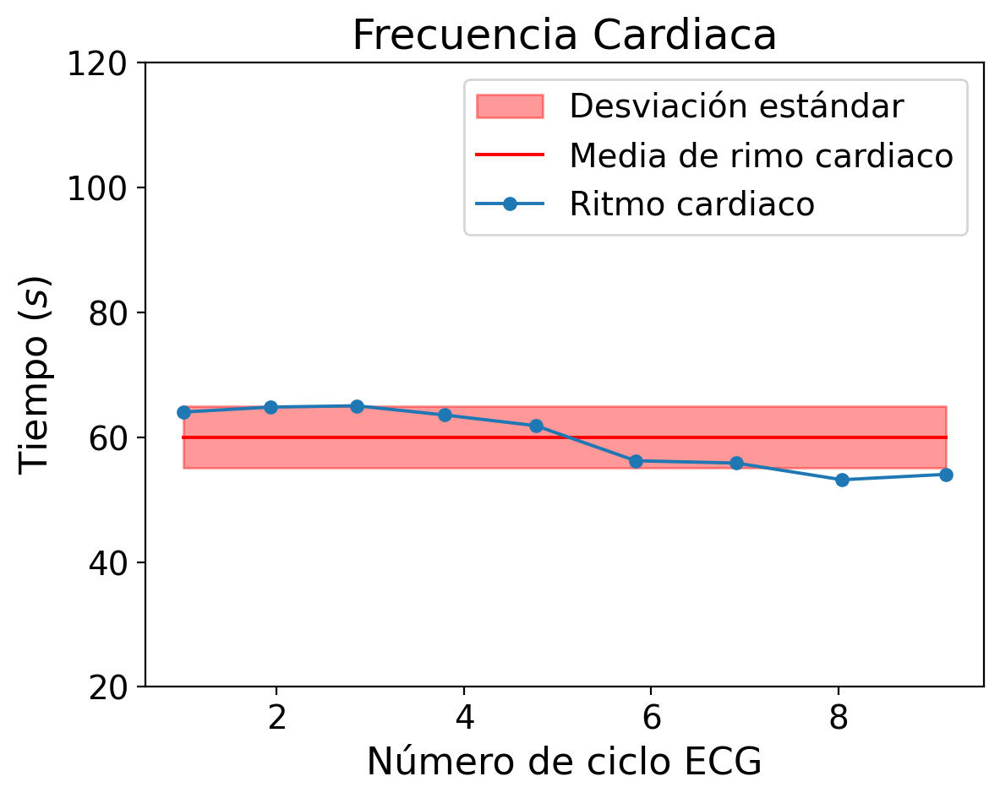

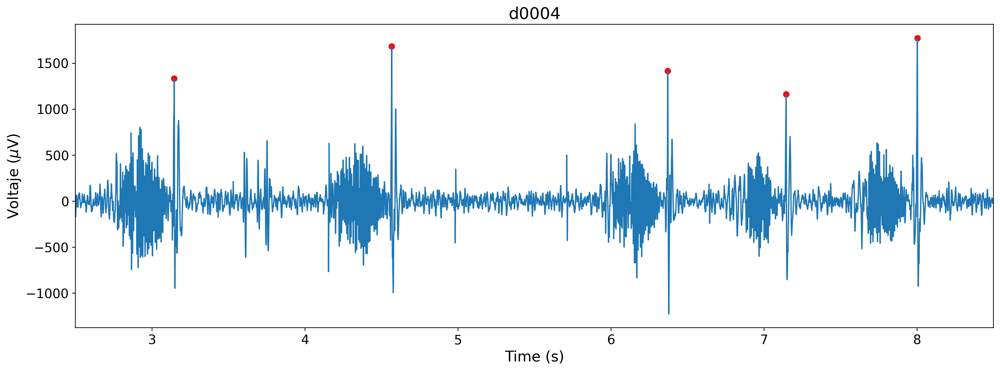

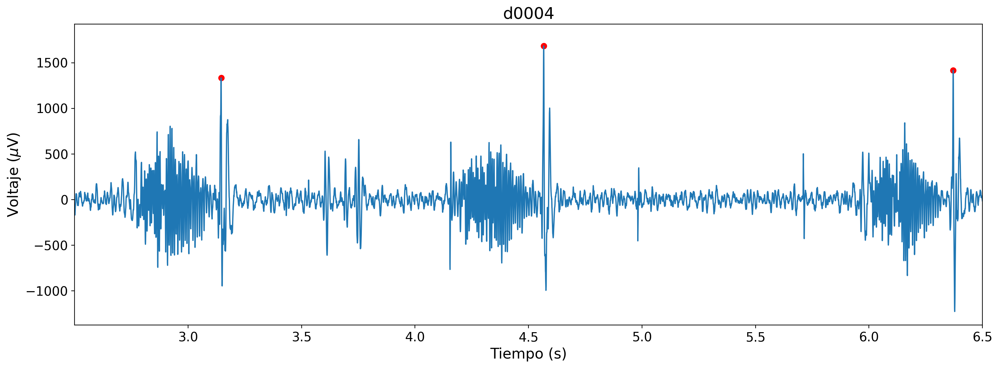

Latidos por minuto: 50.001539088386295


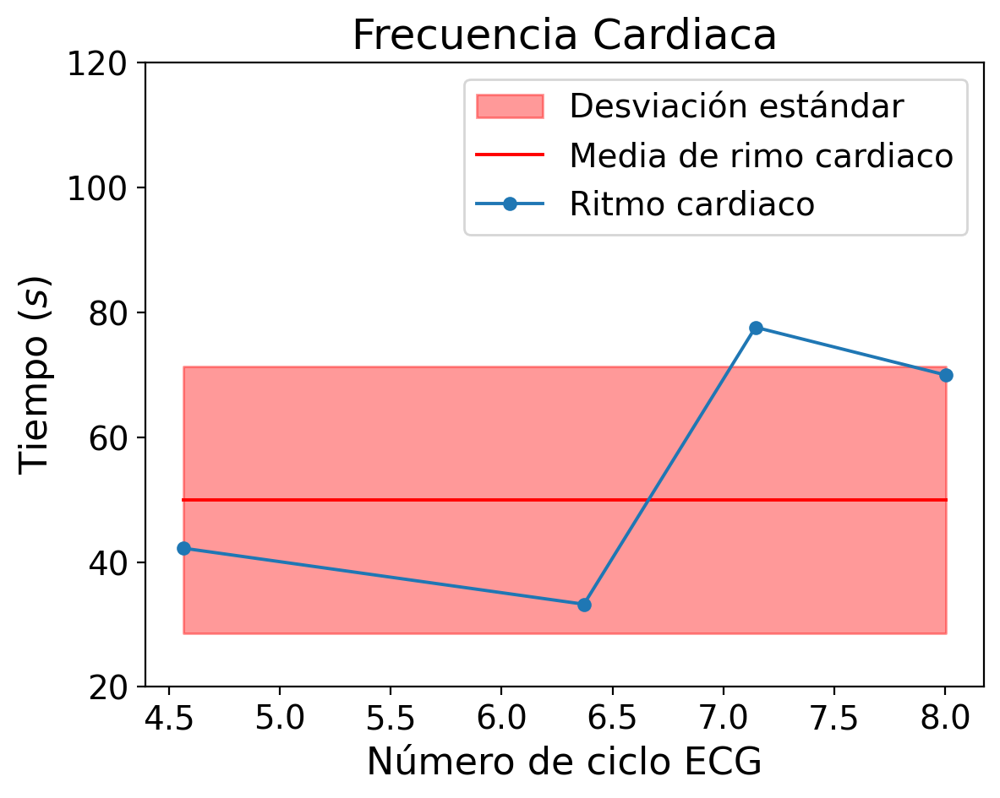

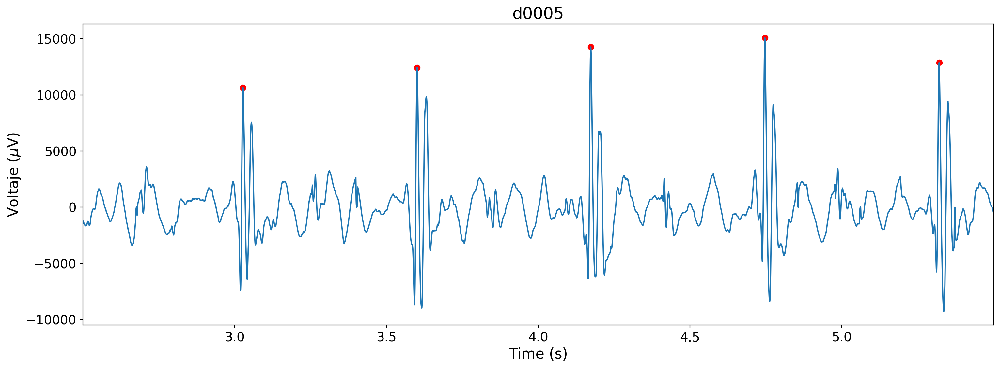

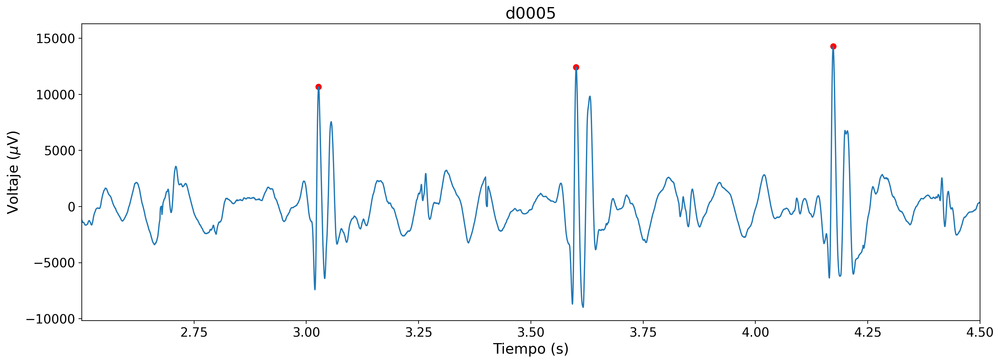

Latidos por minuto: 100.01135929521568


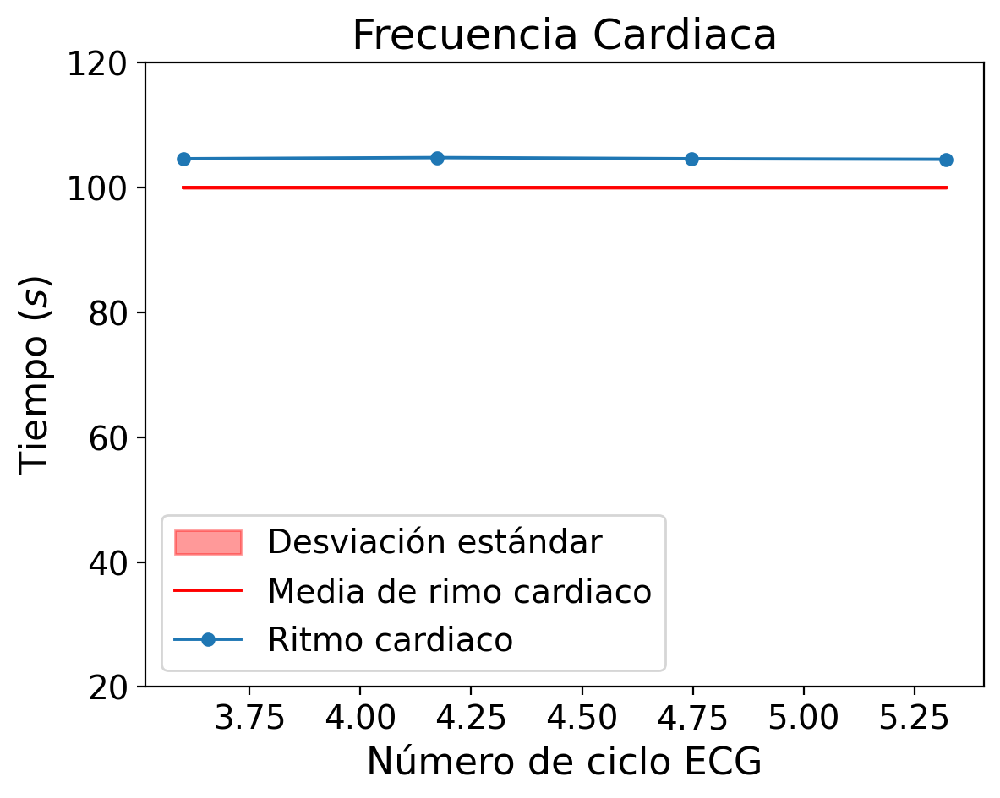

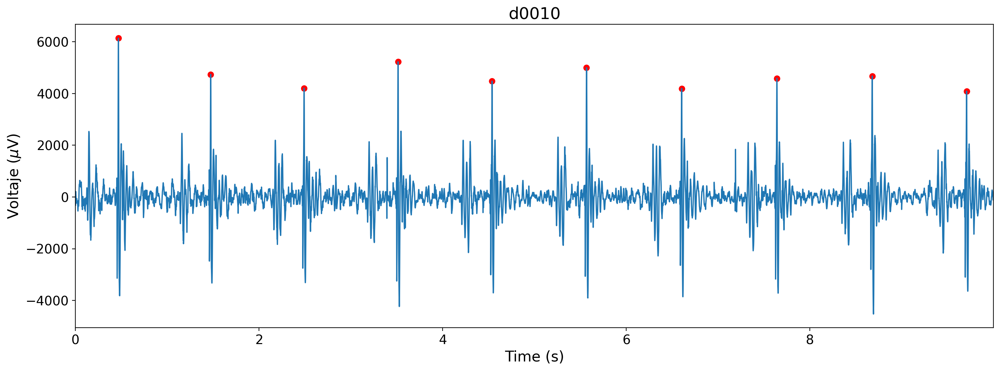

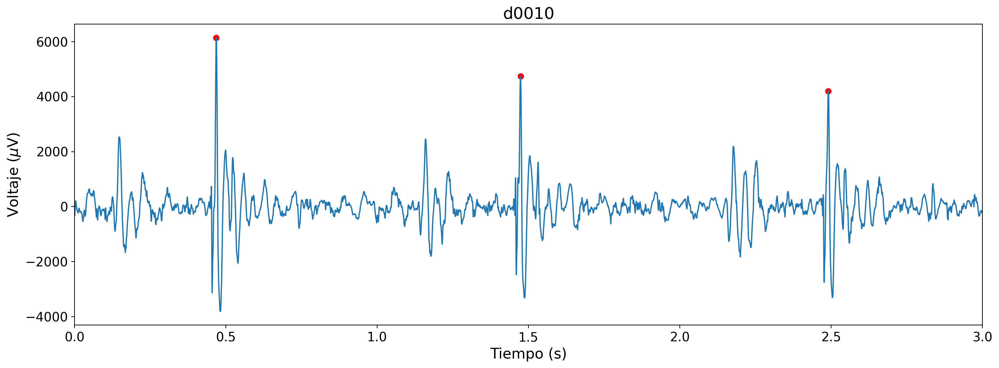

Latidos por minuto: 60.000509882310894


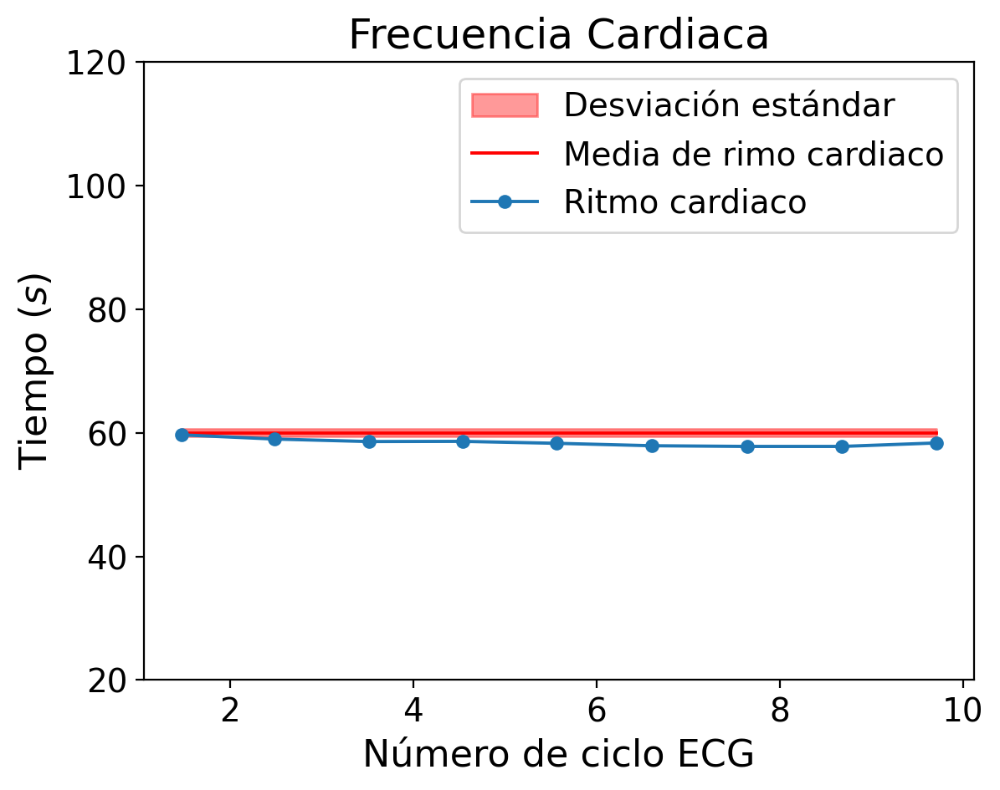

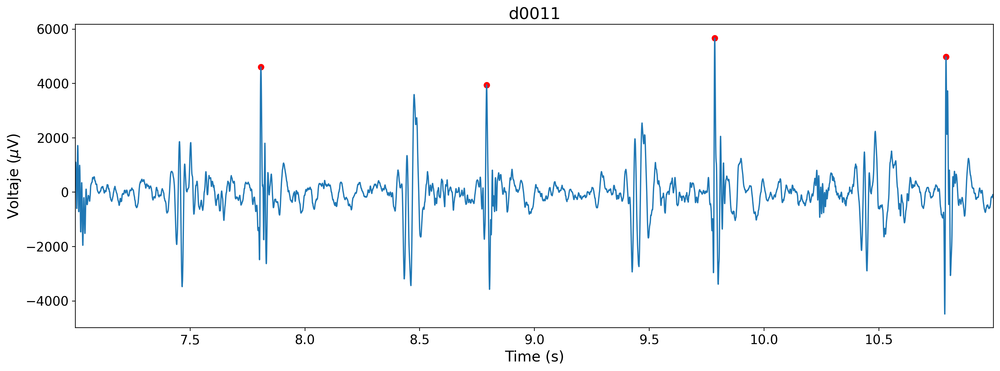

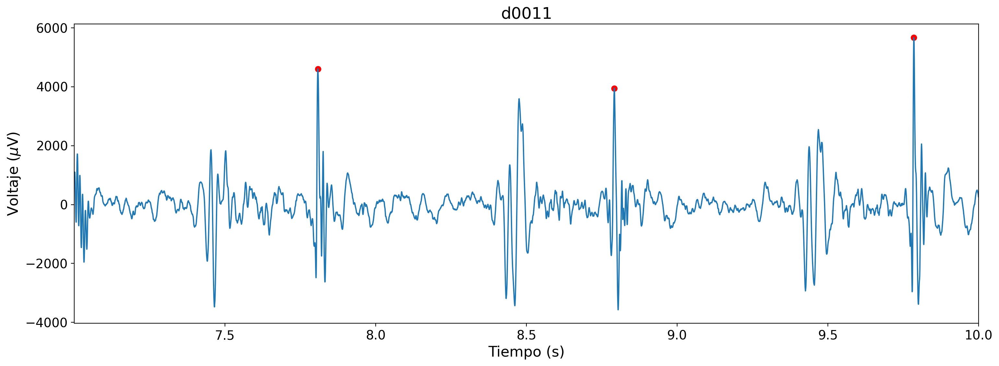

Latidos por minuto: 60.00620038493108


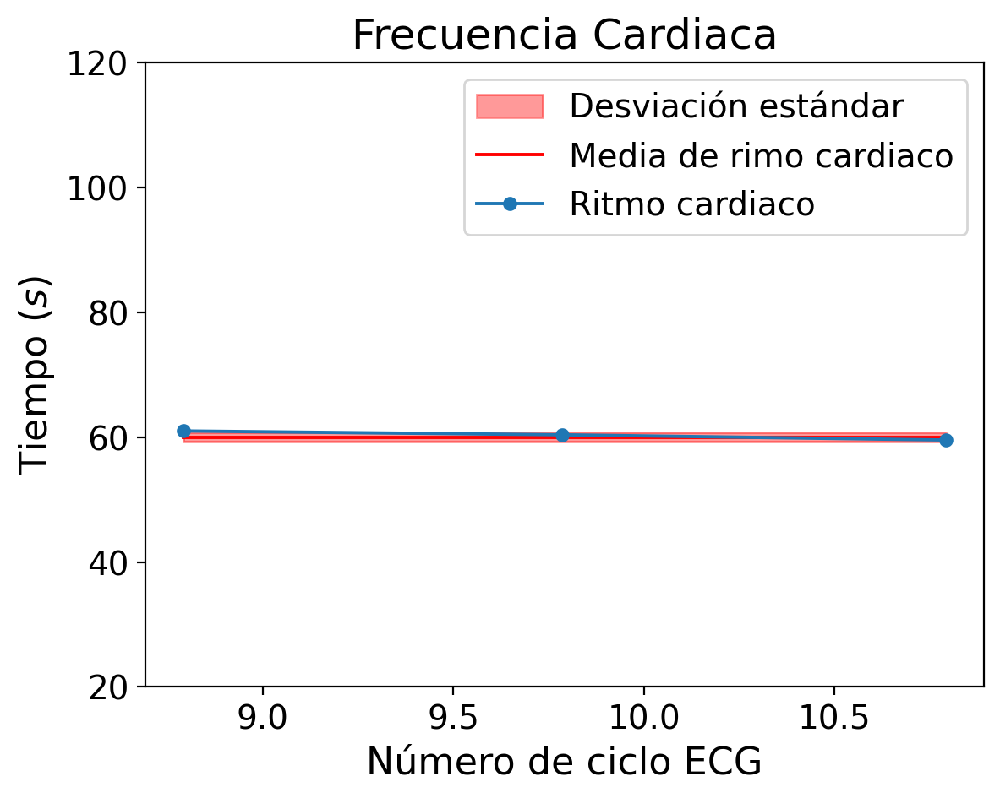

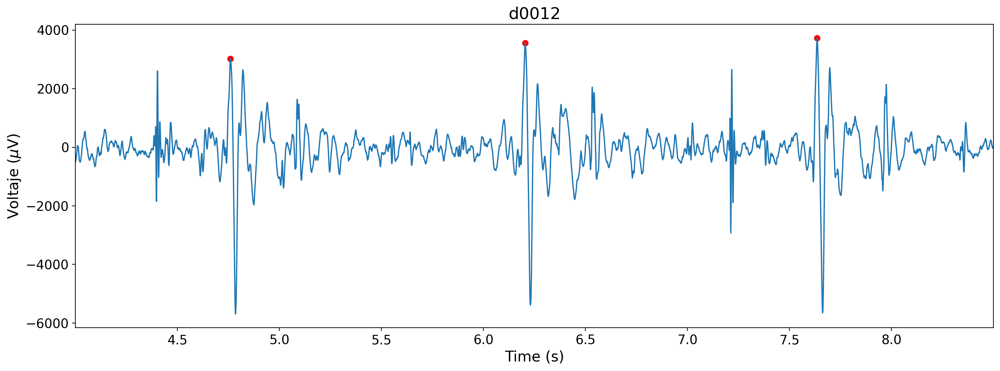

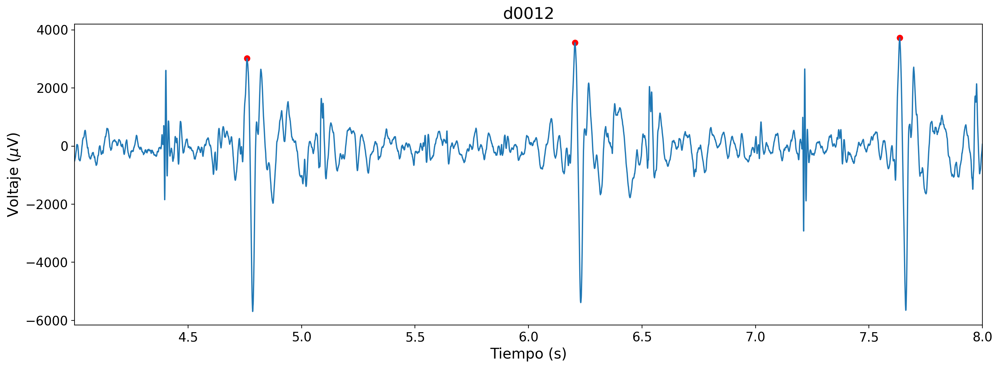

Latidos por minuto: 40.00327316196624


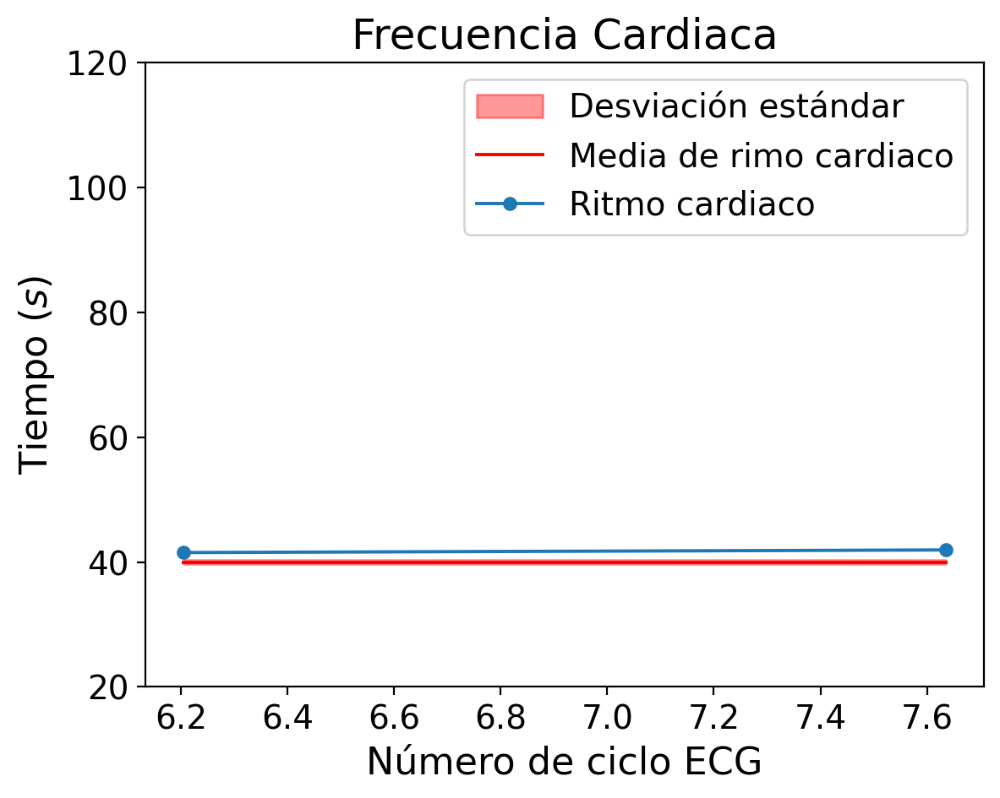

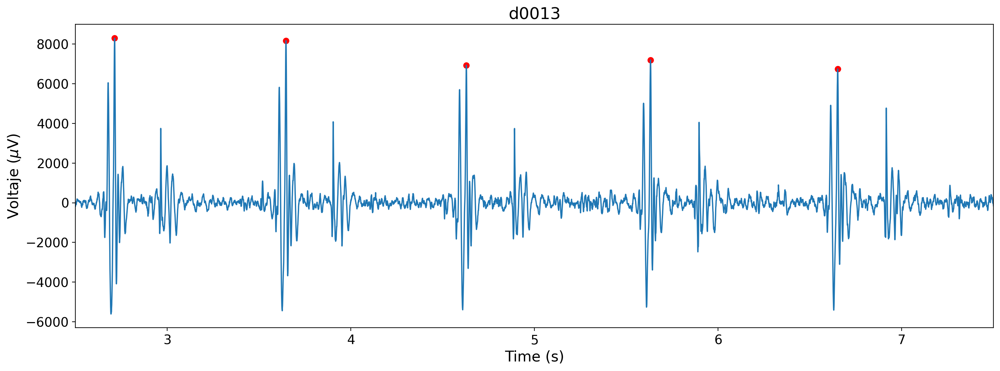

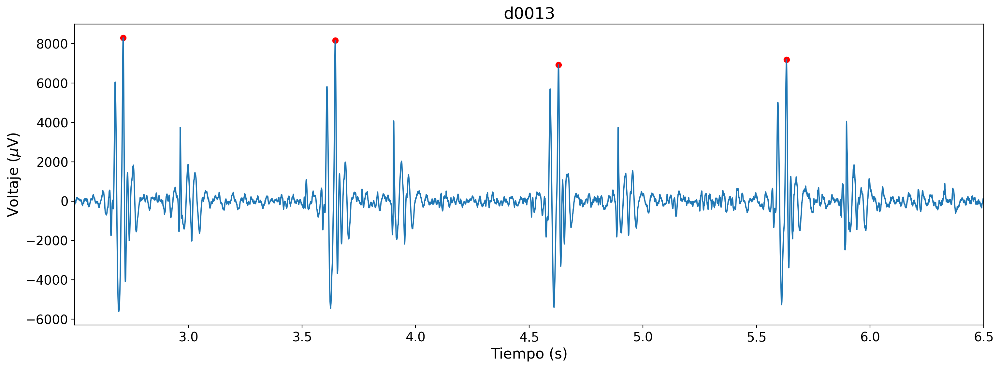

Latidos por minuto: 60.00274683145573


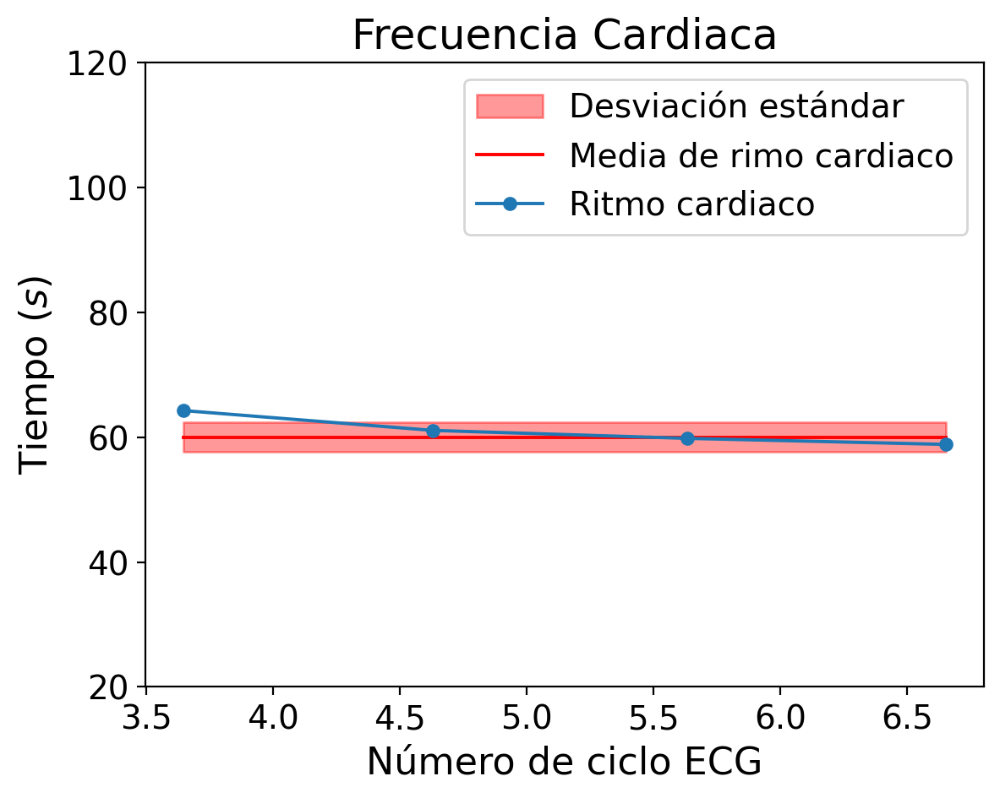

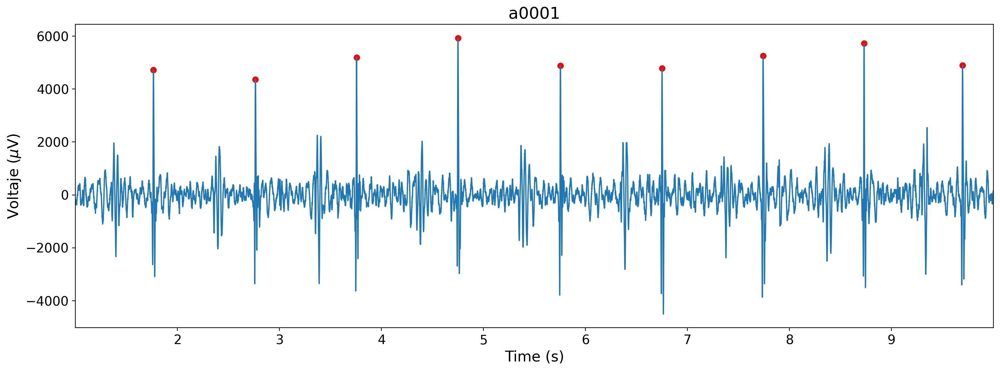

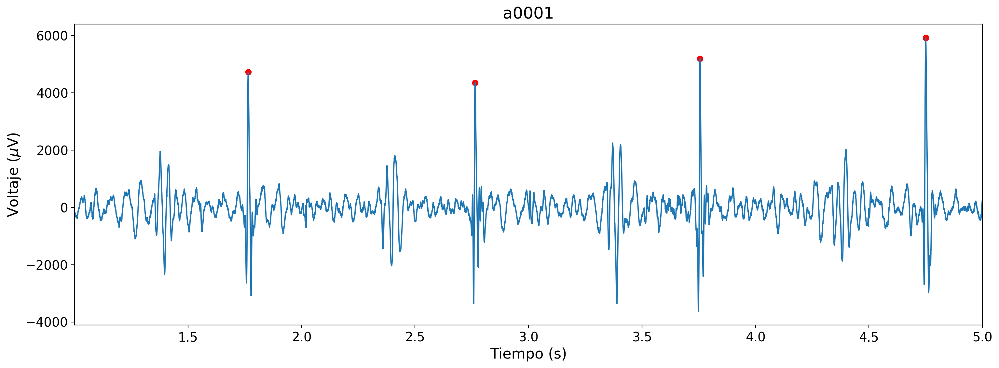

Latidos por minuto: 60.002492334578854


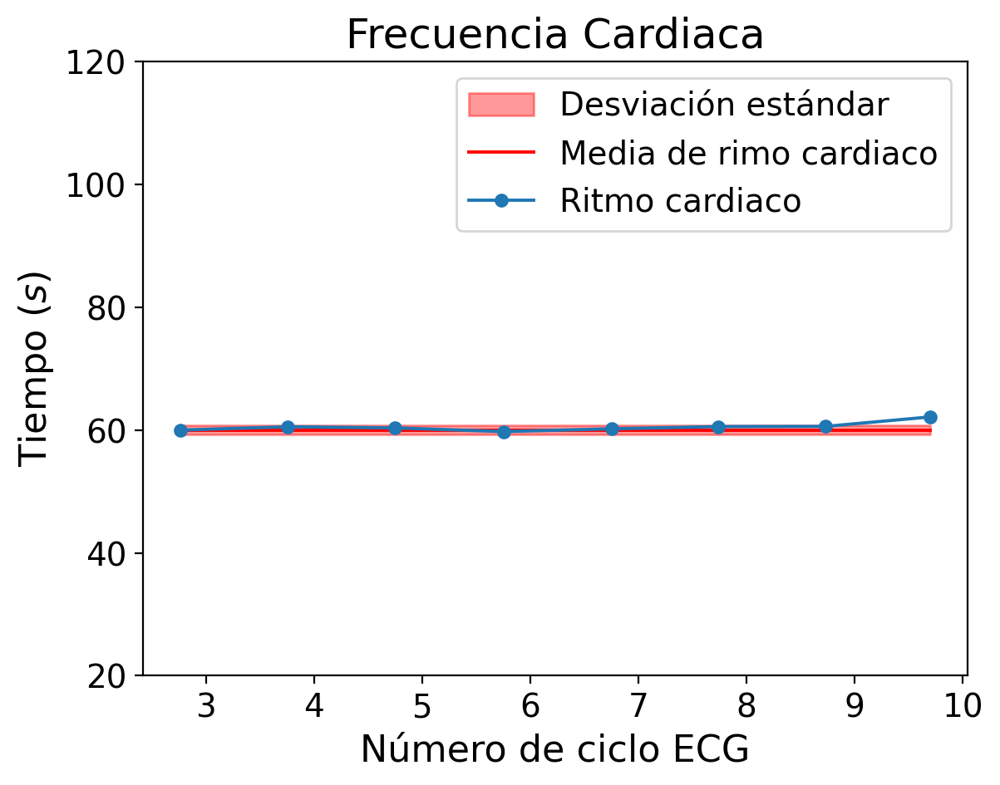

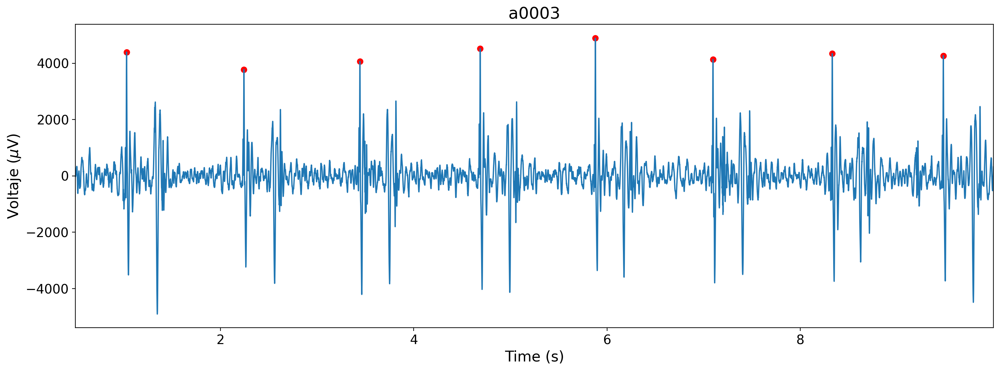

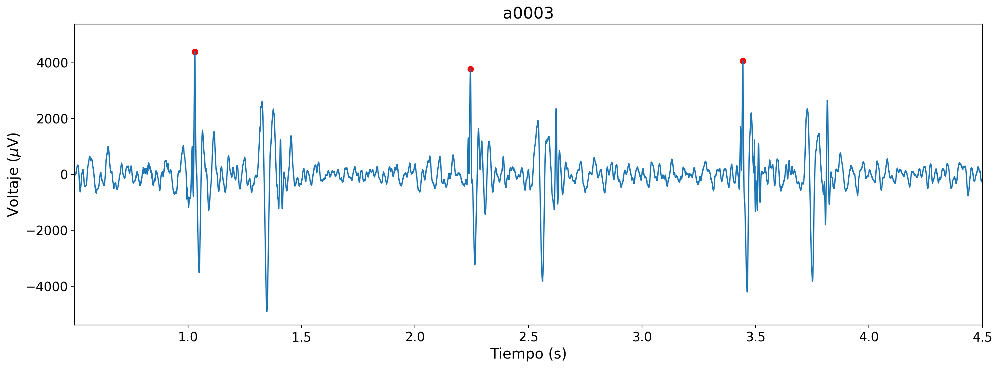

Latidos por minuto: 50.528152797515666


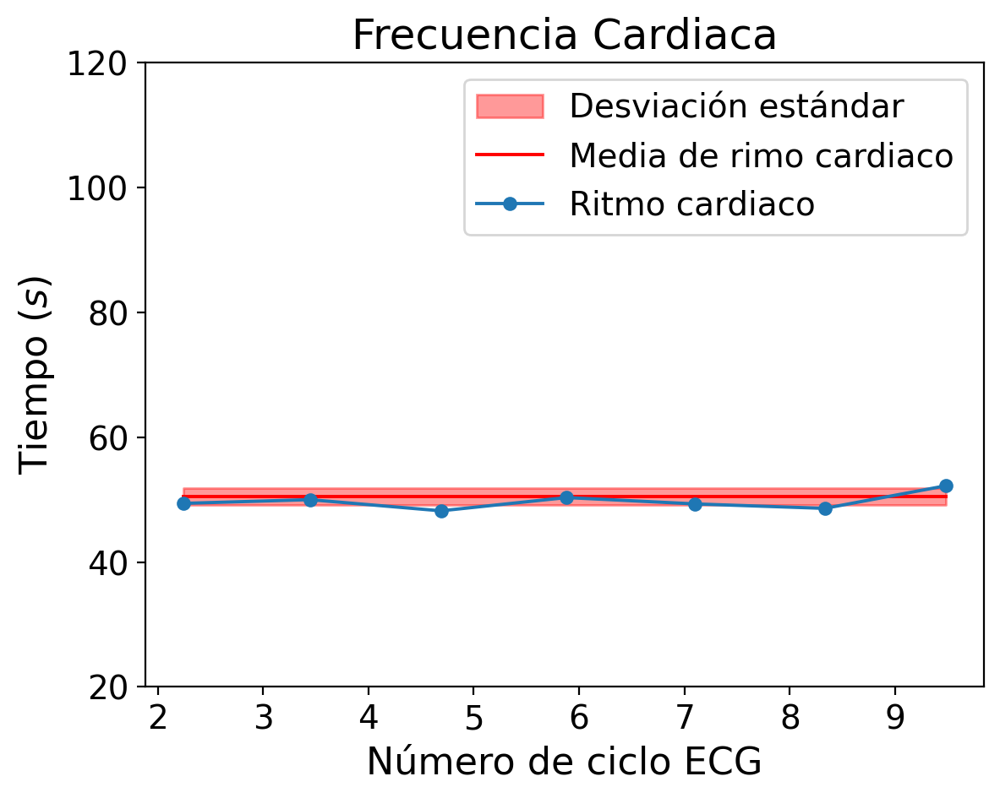

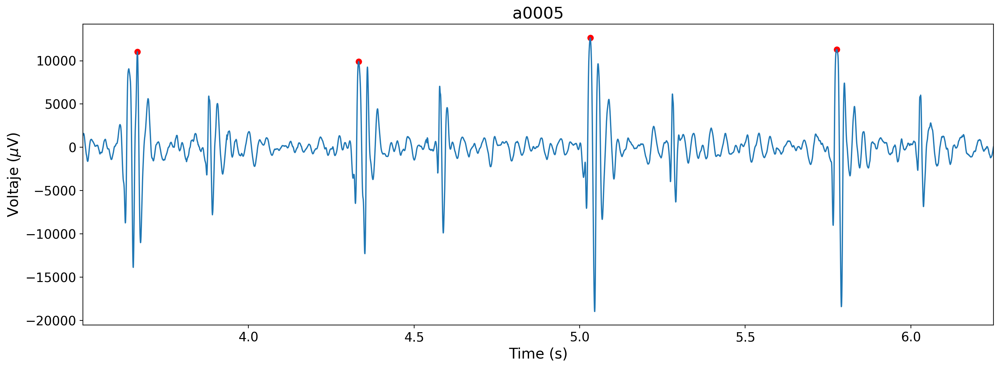

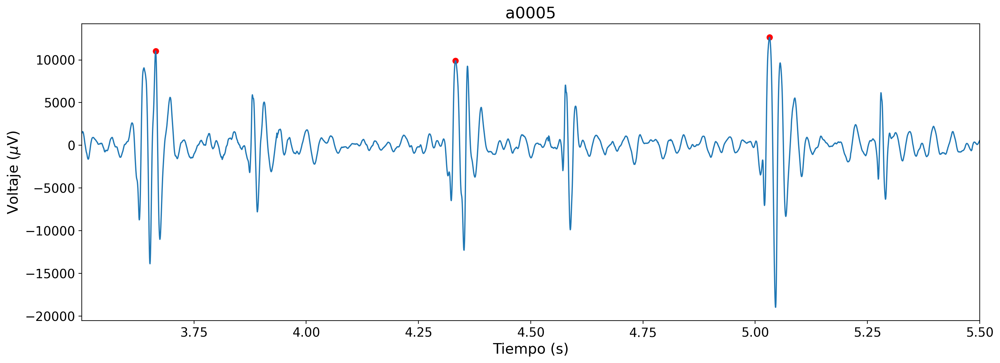

Latidos por minuto: 87.28737423208945


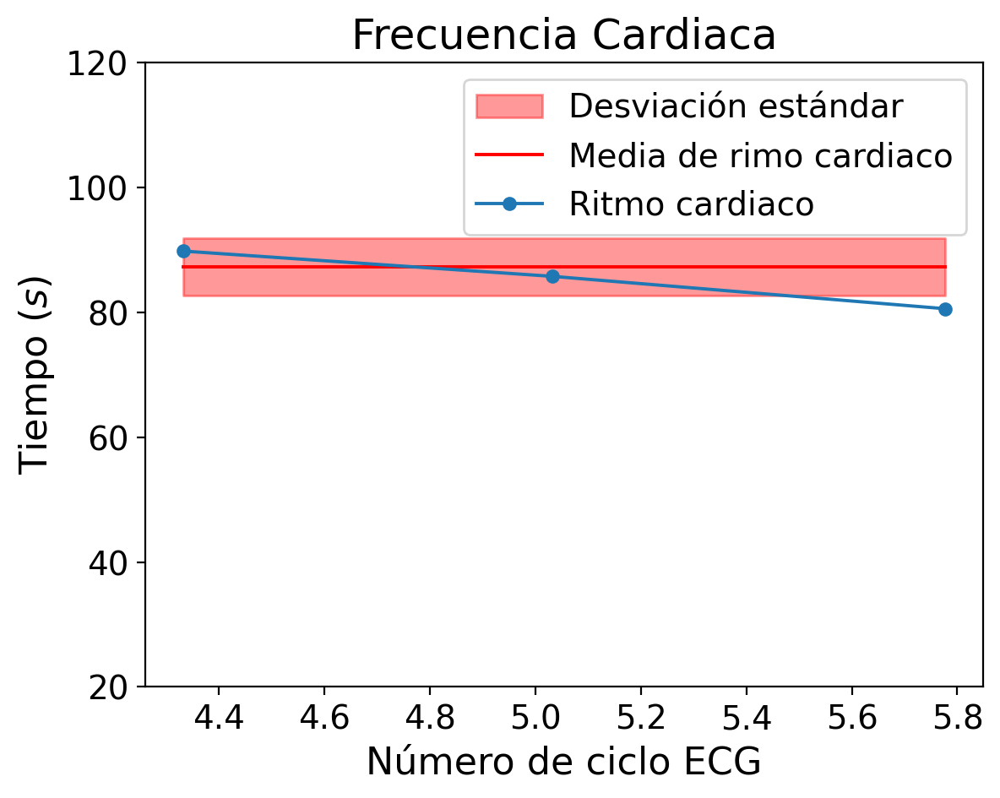

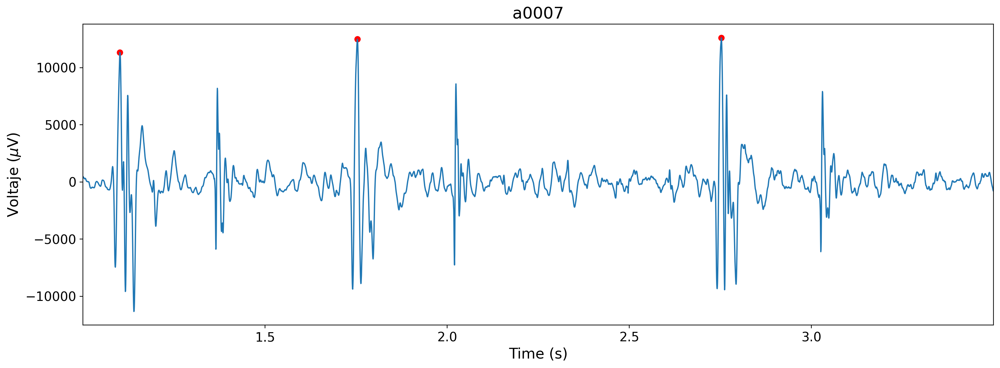

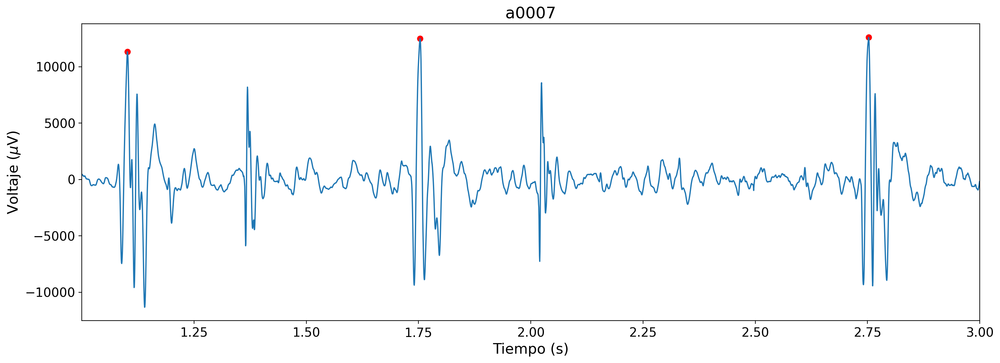

Latidos por minuto: 72.01339331400179


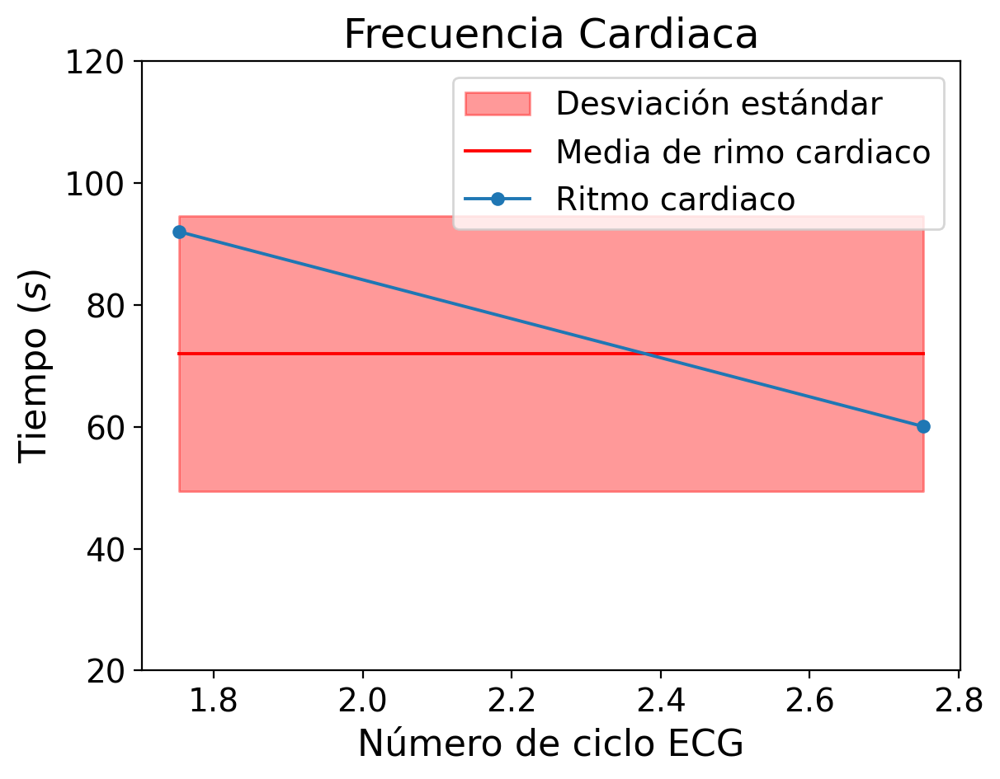

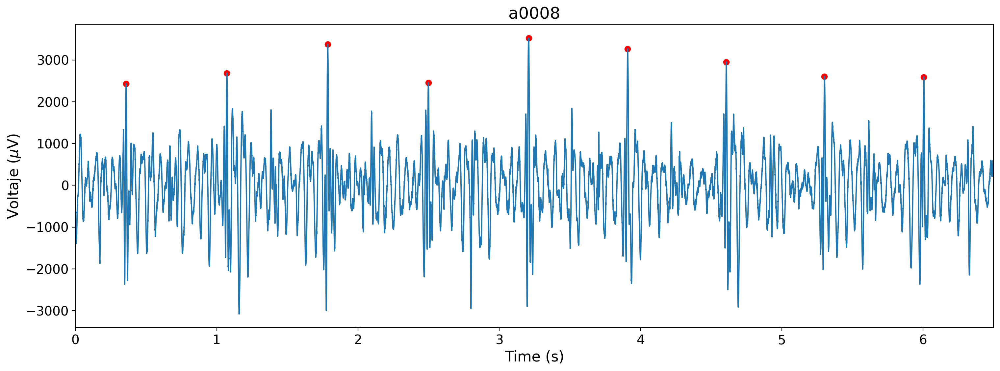

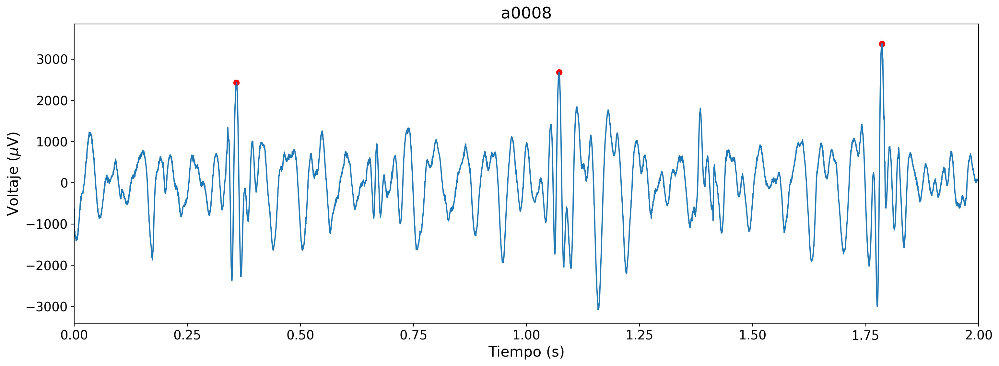

Latidos por minuto: 83.08215389784634


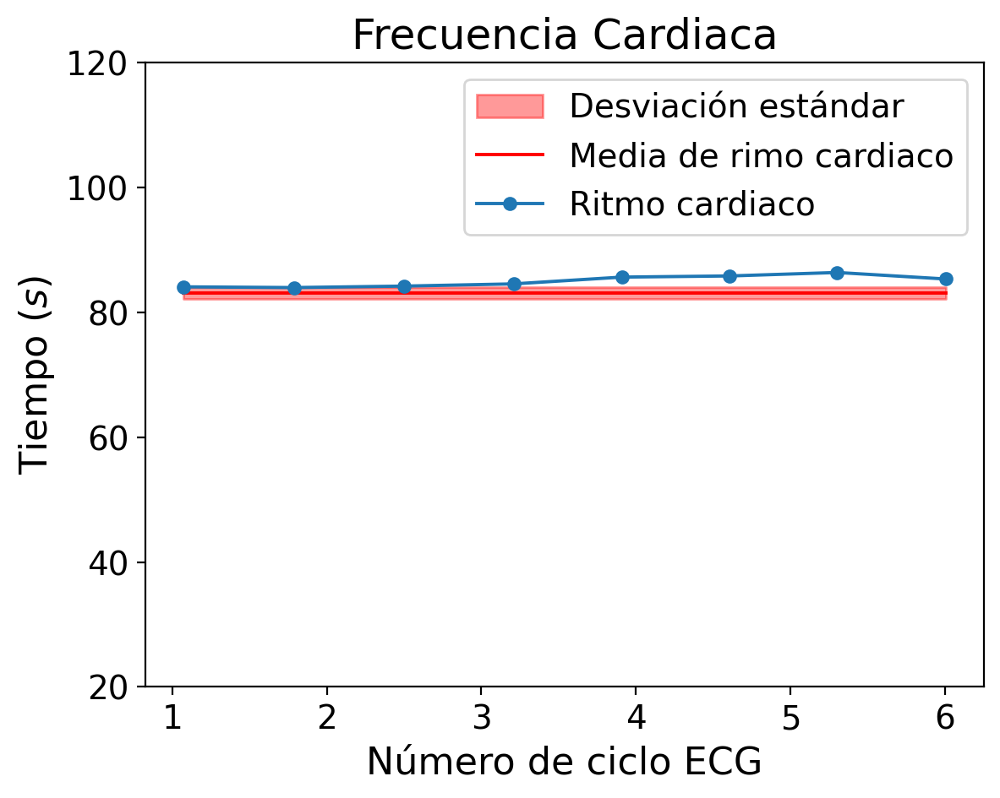

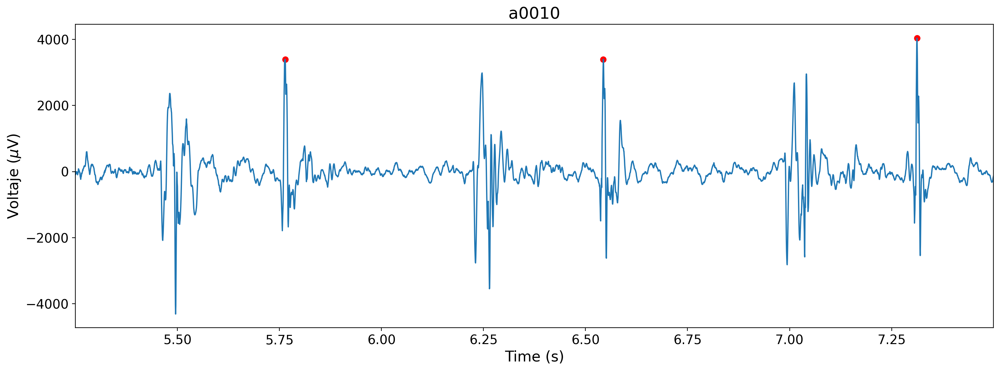

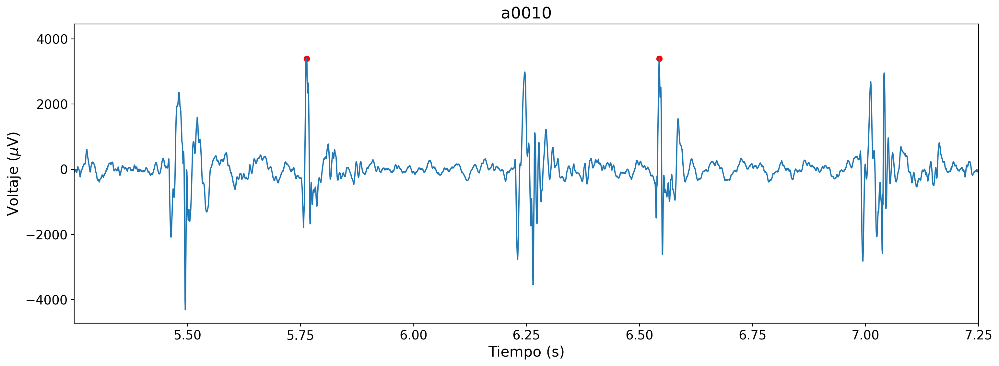

Latidos por minuto: 80.01666216102647


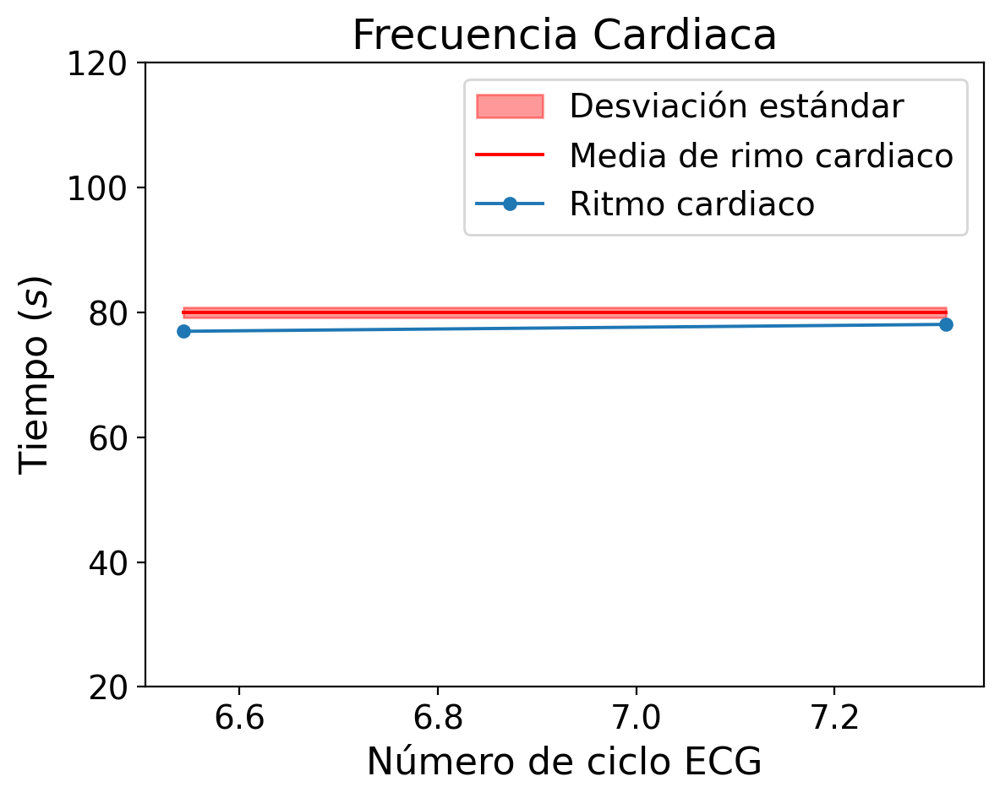

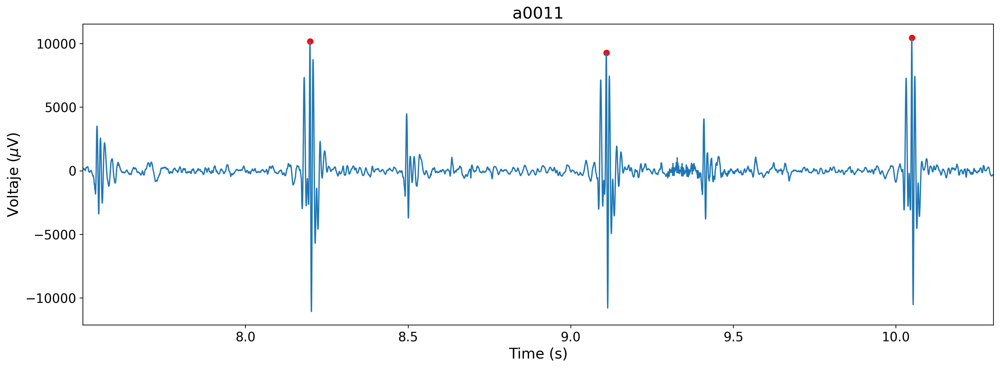

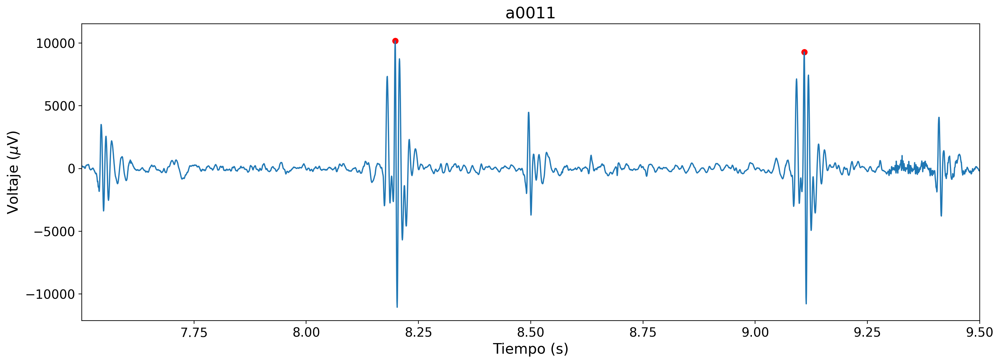

Latidos por minuto: 64.29629278854787


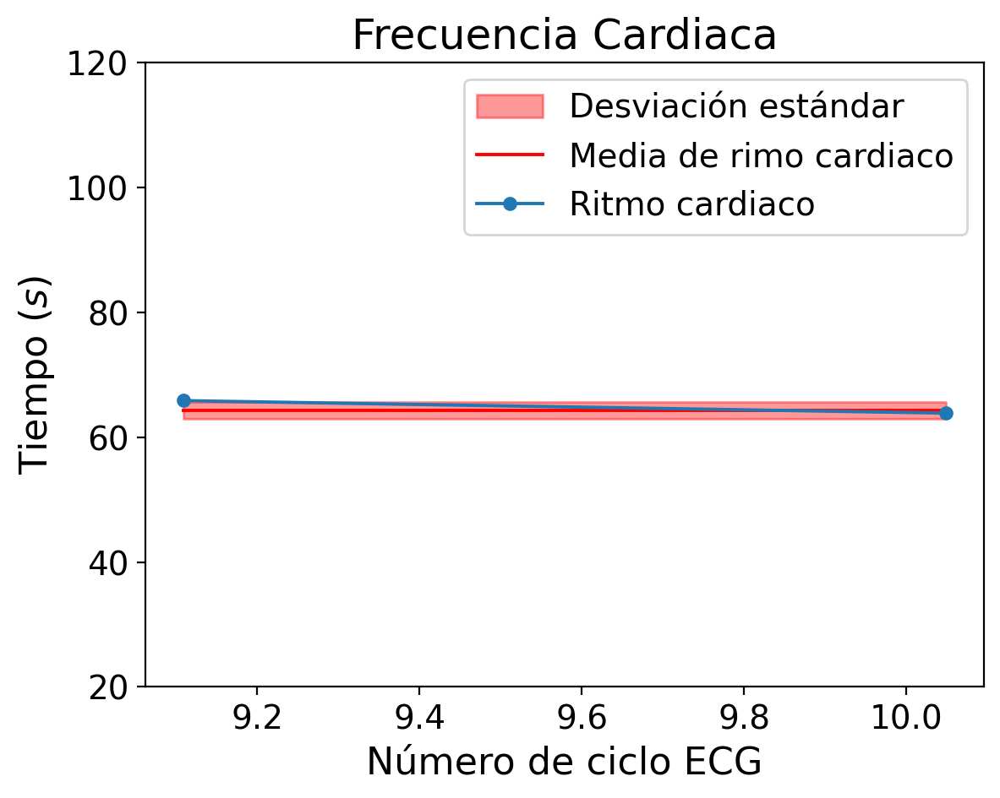

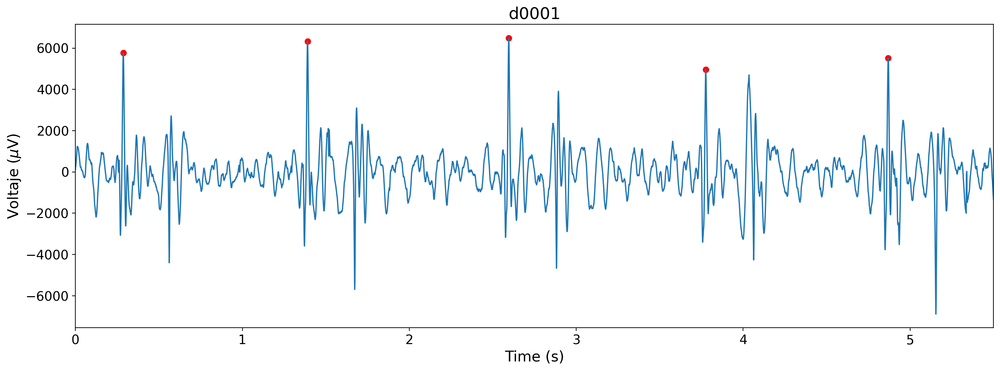

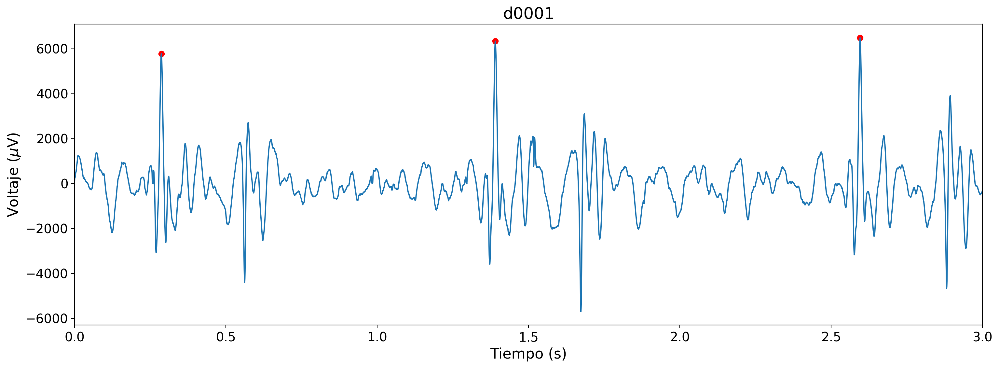

Latidos por minuto: 54.546285757687805


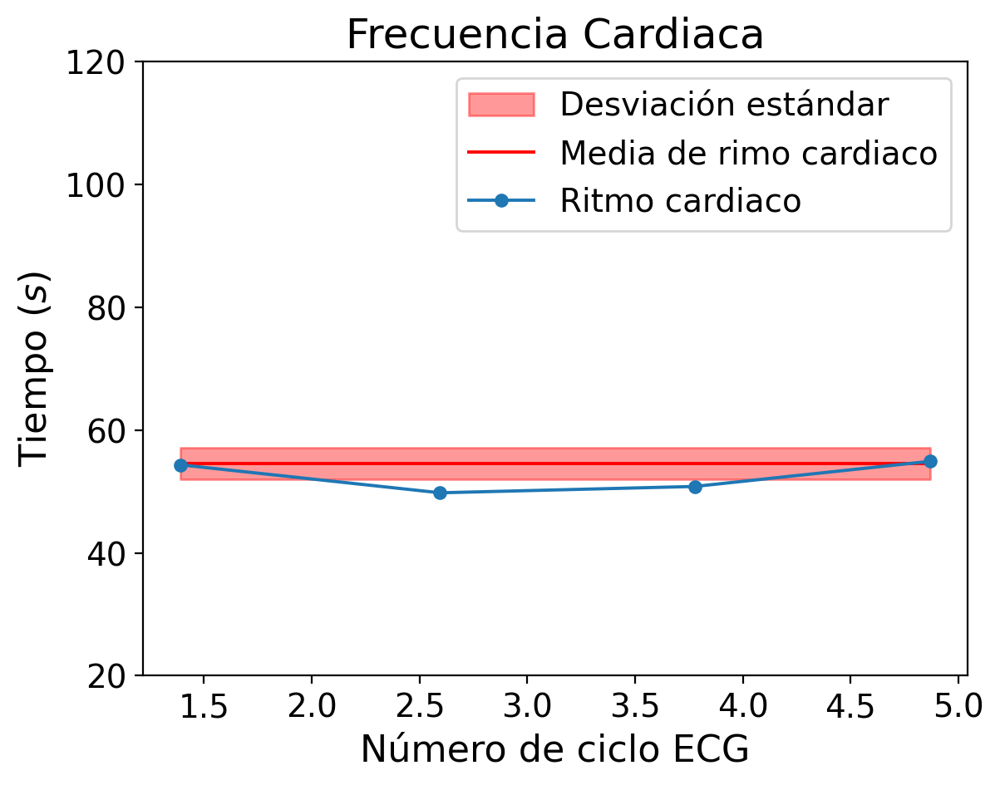

In [ ]:
for i in range(0, len(nice)):
    timeECG, waveData = ecg(nice[i]+'.wav')
    # se vuelve a calcular las variables m1 y m2
    m1 = int(n1[i]*2000)
    m2 = int(n2[i]*2000)
    # se recorta nuevamente el tamaño de las variables "timeECG" y "waveData" en donde se calcularán los picos R
    timeECG, waveData = timeECG[m1:m2], waveData[m1:m2]
    # Se llama la función "detecta_maximos_locales" y se guarda los indices de los picos R en la variable "mxs_indices"
    mxs_indices = detecta_maximos_locales(timeECG, waveData,thr_ra[i])
    plt.figure(figsize=(18,6))
    plt.xlabel(r'Time (s)')
    plt.ylabel(r'Voltaje ($\mu$V)')
    plt.xlim(min(timeECG),max(timeECG))
    plt.plot(timeECG, waveData)
    plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r') # se generan puntos rojos en la ubicación de los picos R en la gráfica
    plt.title(nice[i])
    plt.show()
    # se realiza un acercamiento en la gráfica para visualizar 2 o 3 latidos
    init_sec = 0
    end_sec = [3,4,2,3,3,4,4,4,4,2,2,2,2,2,3]
    plt.figure(figsize=(18,6))
    plt.xlabel(r'Tiempo (s)')
    plt.ylabel(r'Voltaje ($\mu$V)')
    plt.xlim(timeECG[init_sec*2000],timeECG[end_sec[i]*2000])
    plt.plot(timeECG[init_sec*2000:end_sec[i]*2000], waveData[init_sec*2000:end_sec[i]*2000])
    plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r')
    plt.title(nice[i])
    plt.show()

    mean_bpm = 60*(len(mxs_indices)/(timeECG[-1]-timeECG[0]))
    print("Latidos por minuto:", mean_bpm)

    heart_rate = [(60/(timeECG[mxs_indices[i+1]]-timeECG[mxs_indices[i]])) \
                  for i in range(0, len(mxs_indices)-1)]
    time = timeECG[mxs_indices]

    mean_vec = [mean_bpm for i in range(0, len(time)-1)]
    std_vec_plus = [mean_bpm+stdev(heart_rate) for i in range(0, len(time)-1)]
    std_vec_minus = [mean_bpm-stdev(heart_rate) for i in range(0, len(time)-1)]

    plt.fill_between(time[1:], std_vec_minus, std_vec_plus, facecolor="red",
                     label = "Desviación estándar", color='red', alpha=0.4)
    plt.plot(time[1:], mean_vec, c="r", label = "Media de rimo cardiaco")
    plt.plot(time[1:], heart_rate, markersize=5, marker = "o", label="Ritmo cardiaco")
    plt.ylim((20, 120))
    plt.title("Frecuencia Cardiaca")
    plt.xlabel(r'Número de ciclo ECG')
    plt.ylabel(r'Tiempo ($s$)')
    plt.legend()
    plt.show()

# Análisis de Resultados

### Etapa 1:

-Para la primera parte se pudo generar exitosamente las gráficas de 15 señales de audio que representan latidos de corazón.

-Dentro de dichos gráficas se pudo apreciar la amplitud máxima de cada latido representada por los picos R. Además, se seleccionó una de los gráficas para amplificar su imagen y poder observar con mayor detalle 3 latidos e incluso se amplió aún más para poder observar un latido por serparado.

-Con los acercamientos de las gráficas, se pudo realizar una estimación visual de la posible frecuencia cardiaca, en donde se distinguió que dicha frecuencia podría ser cercana a los 1.43 Hz.

### Etapa 2:

-Para llevar acabo esta etapa, se decidió cambiar los audios originales de la etapa 1 por otros que fueran aptos para los cálculos realizados por el programa.

-Se pudo distinguir con éxito los picos R de los ECG, con los cuales se puede observar con mayor facilidad los periodos de latidos, ya que, un periodo sería el tiempo que transcurre entre un pico R y otro pico R.

-El programa pudo calcular con éxito las frecuencias cardiacas de los 15 audios, generando gráficas de estas. Para los audios d0002, d0004, d0011, d0013, a0001, a0003, a0005, a0007, a0008, a0011 y d0001 se pudo realizar gráficas que muestran los datos de una forma muy clara, a diferencia de los audios d0005, d0010, d0012 y a0010, en donde el valor promedio no parace reflejar la realidad, ya que dicha línea se encuentra alejada de los puntos de los ritmos cardiacos por ciclo. Esto se debe a que dichos audios presentaron un ruido alto que posiblemente generó que el programa no lograra realizar adecuadamente los cálculos de ritmocardiaco y su promedio, generando un gráfico que muestra la línea del promedio muy alejada de los puntos azules.

-Los gráficas de los audios d0012, a0007, a0010 y a0011 sólo se aprecian 2 puntos de ritmo cardiaco por ciclo. Esto se debe a que dichos audios presentaban otros picos que llegaban a superar los picos R en varios intervalos. Por esta razón, se decidió cortar los audios en intervalos pequeños que sólo contenían los 3 picos R más limpios de cada audio, por lo tanto, intervalos que sólo contenían dos periodos.

# Conclusiones:

-Al observar electrocardiográmas, es posible calcular a simple vista una aproximación de la frecuencia cardiaca de un audio de latidos de corazón.

-Con un programa de detección de picos R, es posible generar con mucha eficiencia gráficos que representen la frecuencia cardiaca de un paciente, siempre y cuando, el electrocardiográma analizado tenga la menor cantidad de ruido posible.

-Por la periodicidad característica de un ECG, sería posible calcular una función aproximada a esta mediante el cálculo de su serie de Fourier.

# Referencias:

1. Kachuee, M., Fazeli, S., & Sarrafzadeh, M. (2018). ECG Heartbeat Classification: A Deep Transferable Representation. University of California, Los Angeles (UCLA). https://doi.org/10.1109/ichi.2018.00092

2. del Río Pulido, A. D., McKiernan, E. C., & Facultad de Ciencias, UNAM. (s. f.). ECGAnalysis.ipynb. Gist. Recuperado 27 de agosto de 2023, de https://gist.github.com/emckiernan/3e7e86a48256777e9e6a44ede032d938